So... My solution has a lot of iterations experements and more and more. But firsyly there you can see final code in one cell. It is done specially to test my code, because it is the best one what i have.

Go down if you want to see hell of iterations and suffering.

And some additional info. I took sam2 because it is better than sam in photo postprocessing, it can work with CUDA, higher segmentation accuracy and more and more.

I tried to "repair segmentations" but it not helpped me at all...

                          +--------------------------------+
                          |           Start Program         |
                          +--------------------------------+
                                   |
                          +--------------------------+
                          |  Load SAM2 Model for Mask  |
                          |  Generation & CLIP Model   |
                          +--------------------------+
                                   |
                        +------------------------+
                        | 10 images selection    |
                        +------------------------+
                                   |
                        +-------------------------+
                        |  Load Ground Truth Mask |
                        |  (from gt_semantic_2d)  |
                        +-------------------------+
                                   |
                        +--------------------------+
                        |   Load Image from Path   |
                        +--------------------------+
                                   |
                        +---------------------------+
                        | Generate Masks with SAM2   |
                        +---------------------------+
                                   |
                        +--------------------------+
                        |   Filter Masks with CLIP  |
                        |   (using "chair" prompt) |
                        +--------------------------+
                                   |
                         +-----------------------+
                         | Combine Filters Masks  |
                         +-----------------------+
                                   |
                     +---------------------------------+
                     | Compute IoU with Ground Truth  |
                     +---------------------------------+
                                   |
                     +-------------------------------+
                     | Display Segmentation & IoU    |
                     +-------------------------------+
                                   |
                     +------------------------------------+
                     | Save Segmented Image to Output    |
                     +------------------------------------+
                                   |
                          +-------------------------+
                          |           Done          |
                          +-------------------------+


Using device: cpu


Processing images:   0%|          | 0/35 [00:00<?, ?it/s]C:\Users\Mi\AppData\Local\Temp\ipykernel_37884\1648052985.py:68: RuntimeWarning: Mean of empty slice.
  np.array(np.where(mask2)).mean(axis=1))
C:\Users\Mi\AppData\Local\Temp\ipykernel_37884\1648052985.py:67: RuntimeWarning: Mean of empty slice.
  dist = np.linalg.norm(np.array(np.where(mask1)).mean(axis=1) -


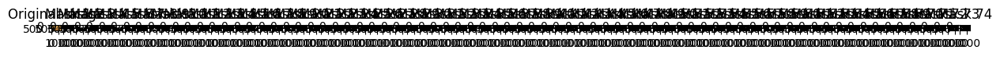

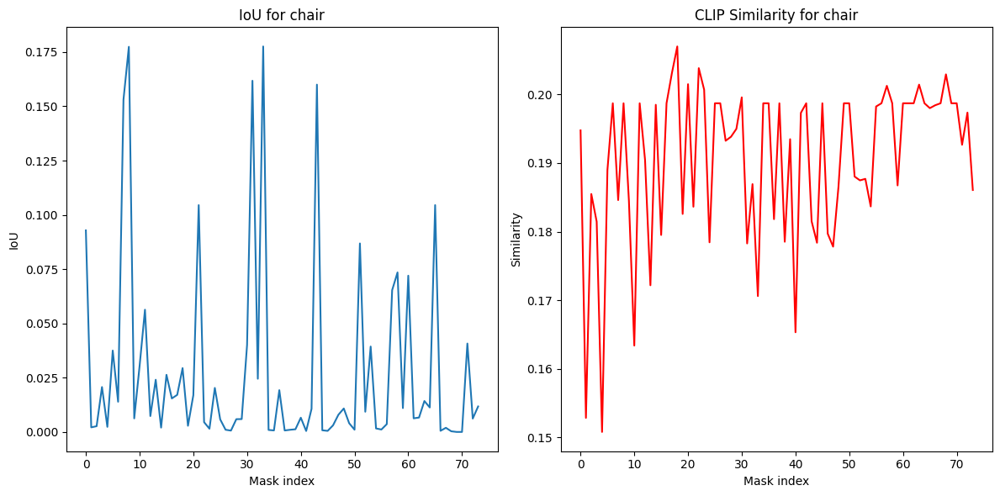

Processing images:   3%|▎         | 1/35 [03:23<1:55:11, 203.29s/it]

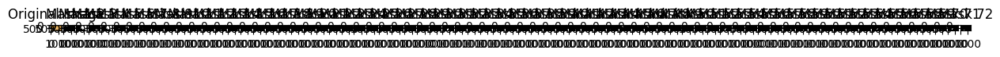

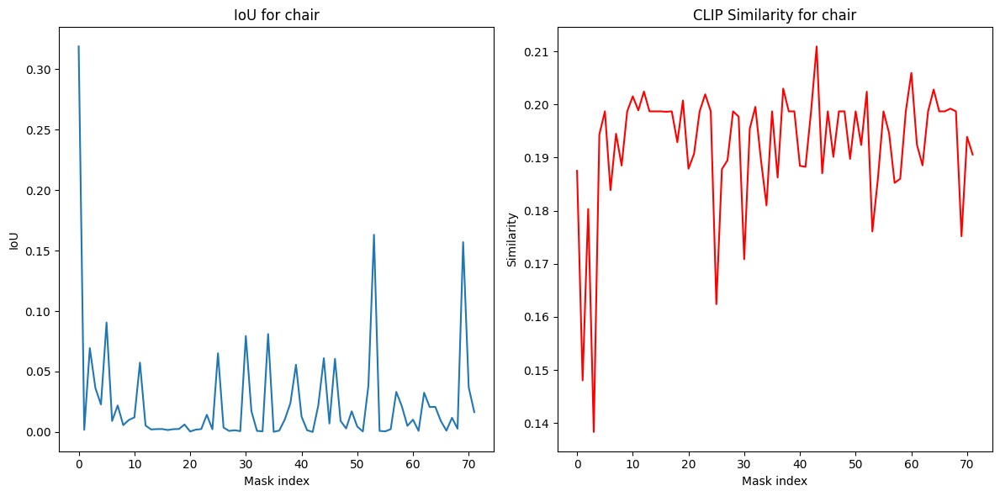

Processing images:   6%|▌         | 2/35 [06:19<1:43:08, 187.52s/it]

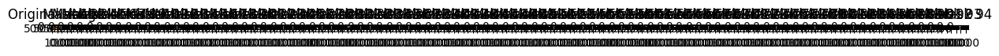

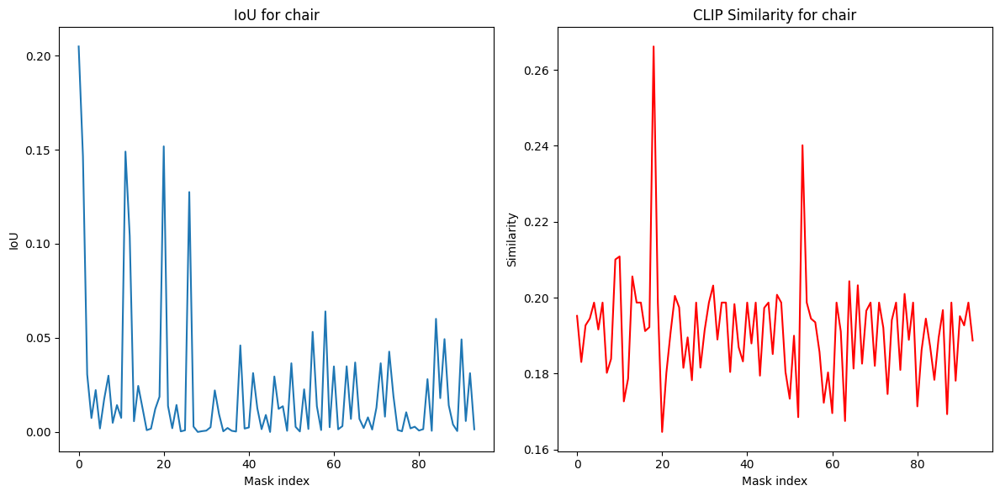

Processing images:   9%|▊         | 3/35 [10:08<1:49:59, 206.25s/it]

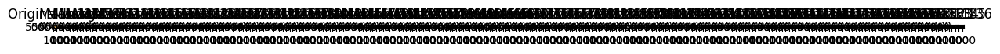

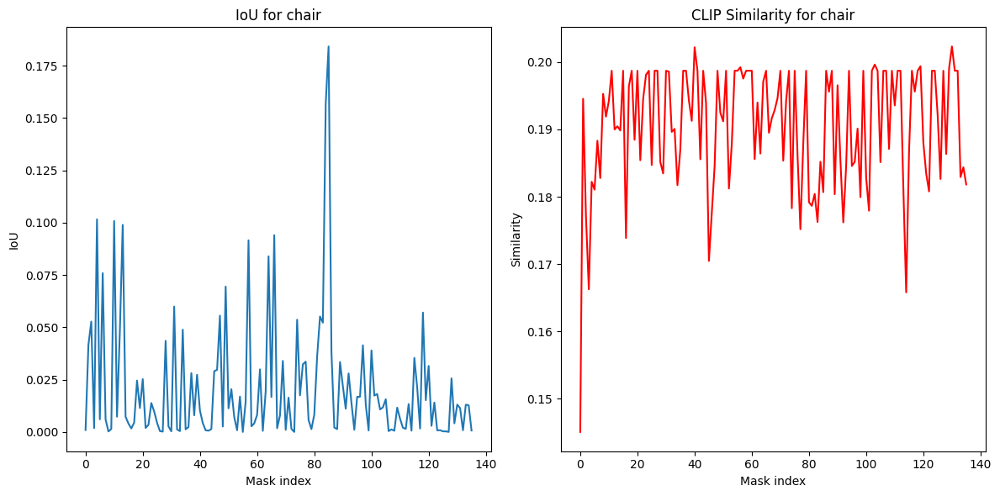

Processing images:  11%|█▏        | 4/35 [16:54<2:27:17, 285.08s/it]

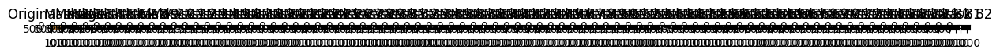

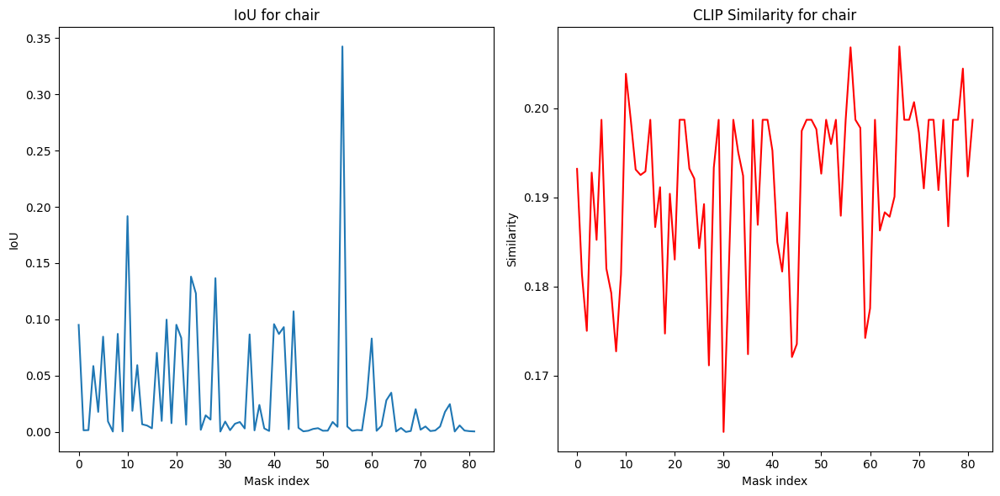

Processing images:  14%|█▍        | 5/35 [20:35<2:11:05, 262.19s/it]

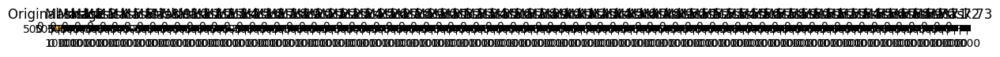

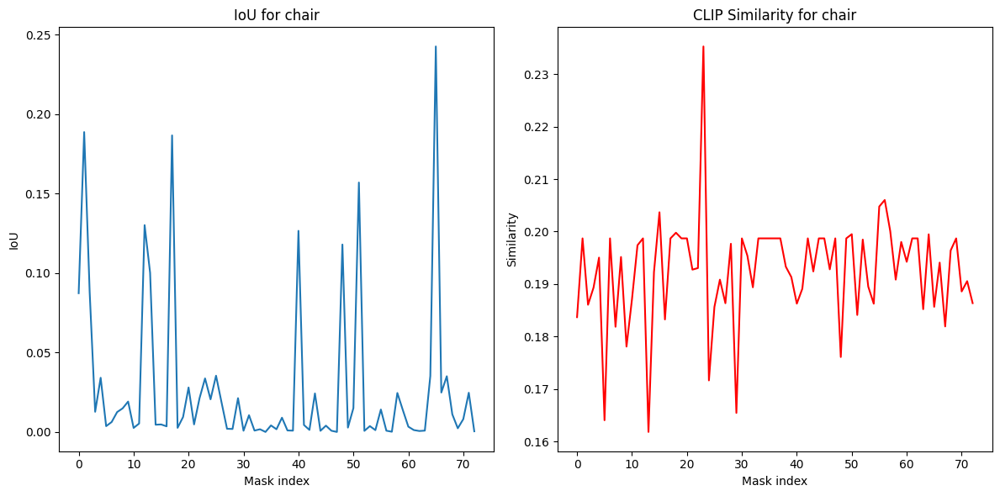

Processing images:  17%|█▋        | 6/35 [23:56<1:56:39, 241.38s/it]

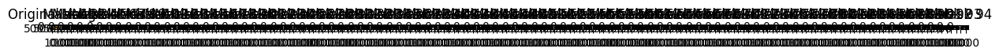

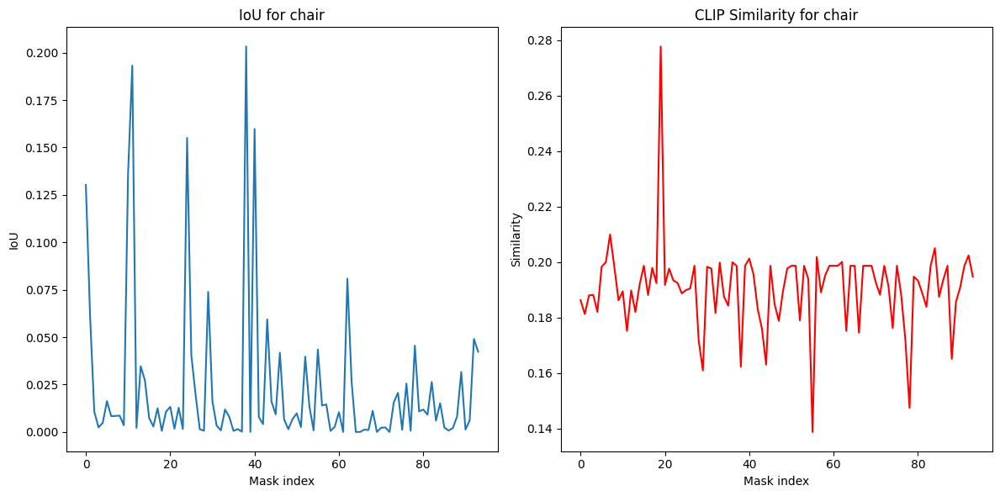

Processing images:  20%|██        | 7/35 [28:11<1:54:38, 245.66s/it]

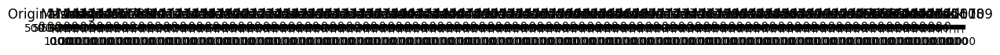

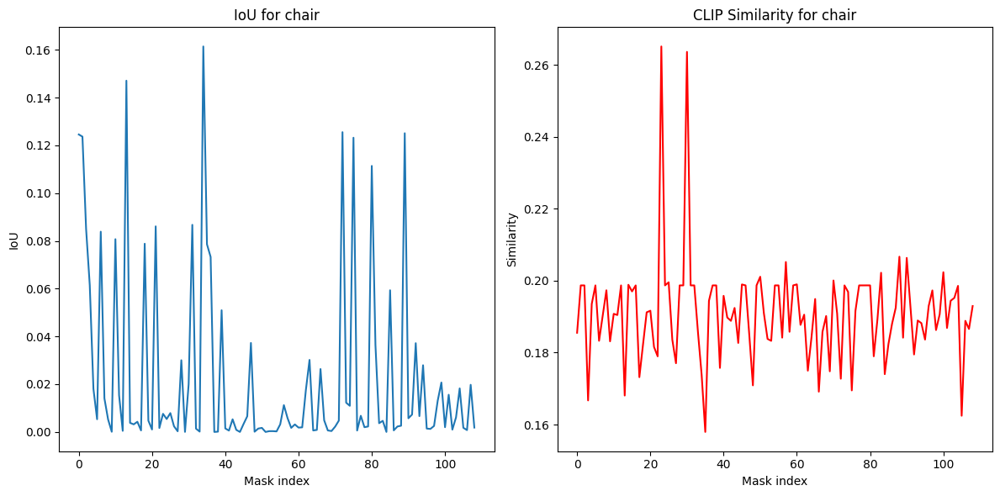

Processing images:  23%|██▎       | 8/35 [32:49<1:55:13, 256.04s/it]

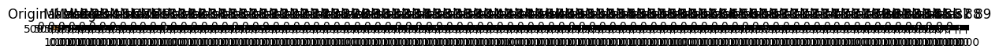

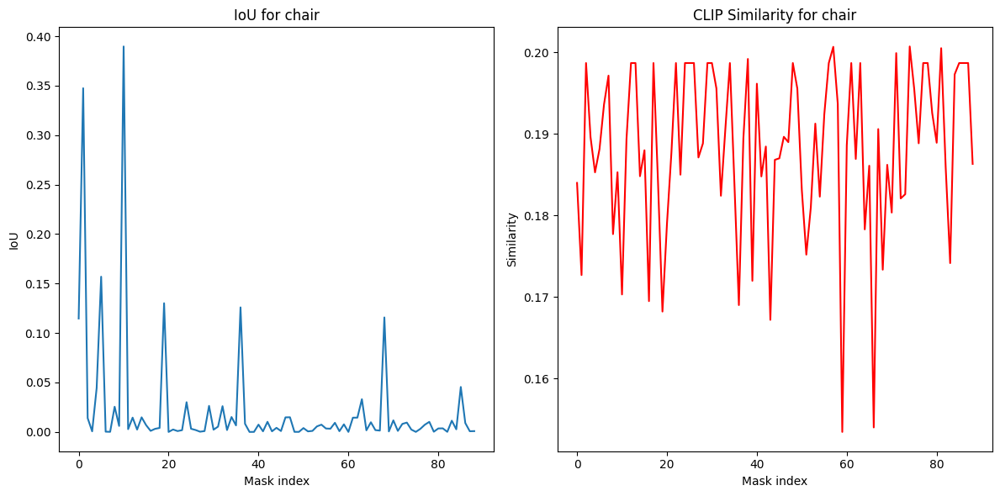

Processing images:  26%|██▌       | 9/35 [36:22<1:45:04, 242.47s/it]

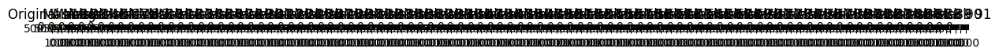

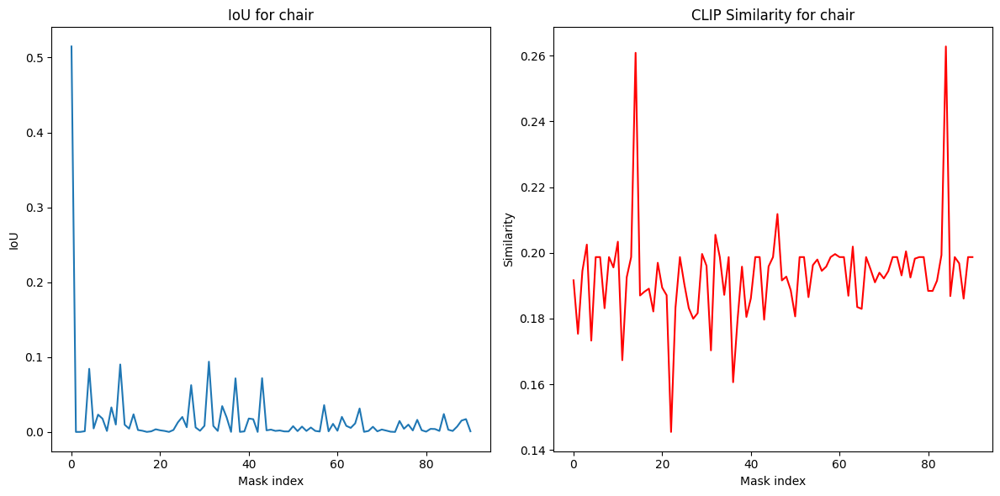

Processing images:  29%|██▊       | 10/35 [40:37<1:42:39, 246.37s/it]

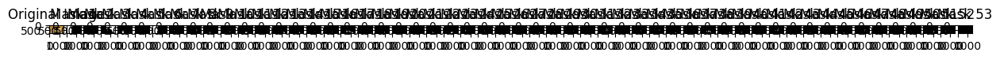

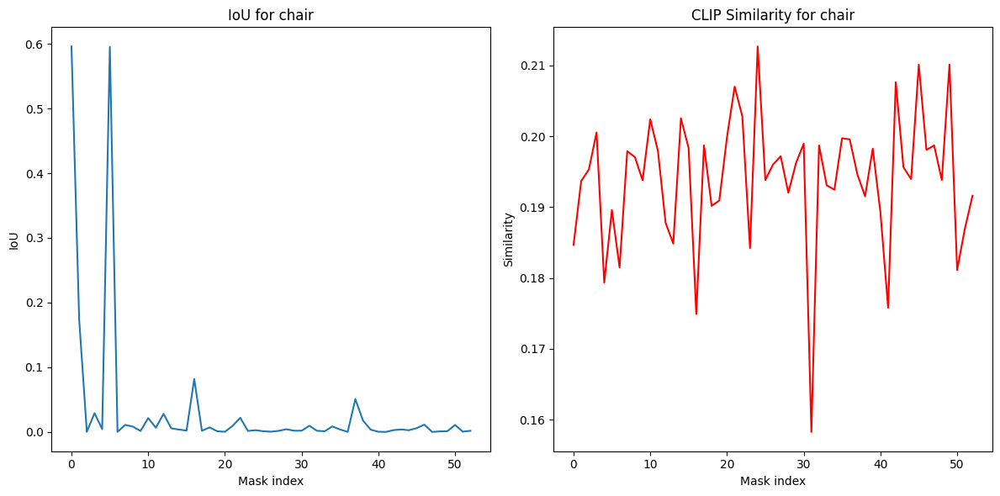

Processing images:  31%|███▏      | 11/35 [44:04<1:33:43, 234.30s/it]

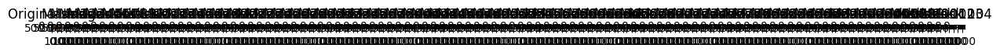

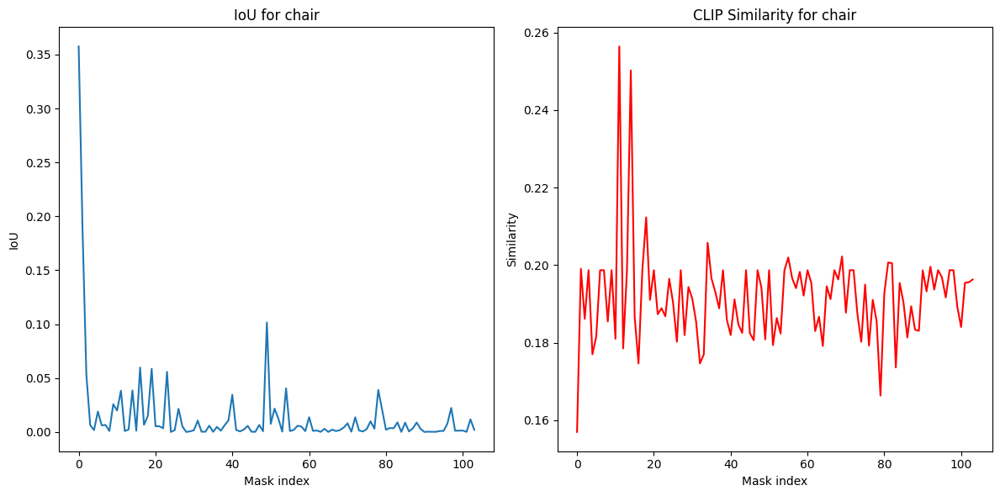

Processing images:  34%|███▍      | 12/35 [49:11<1:38:17, 256.40s/it]

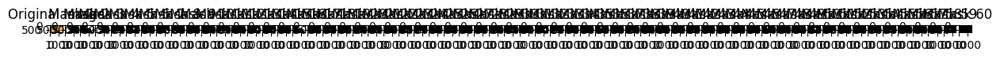

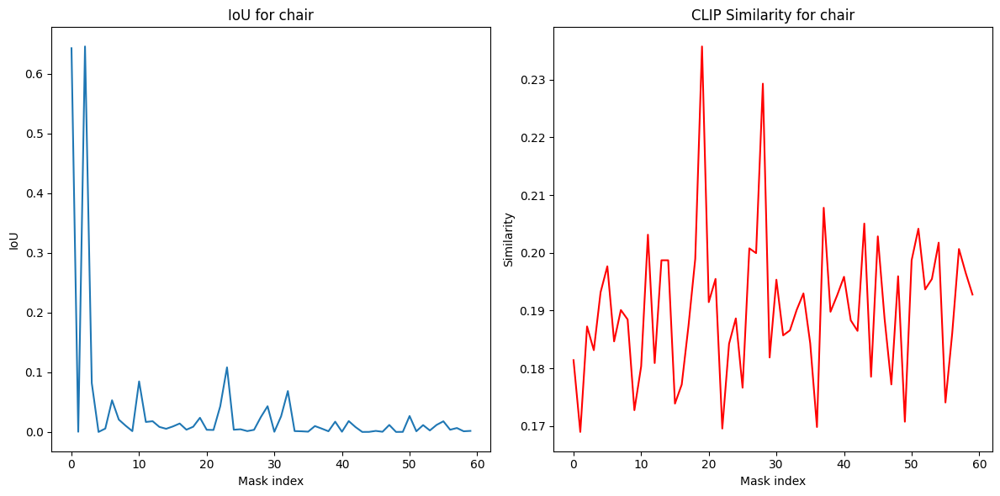

Processing images:  37%|███▋      | 13/35 [51:33<1:21:18, 221.77s/it]

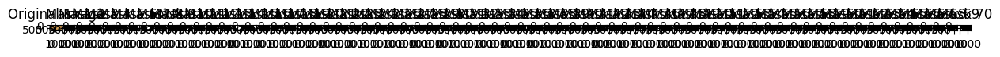

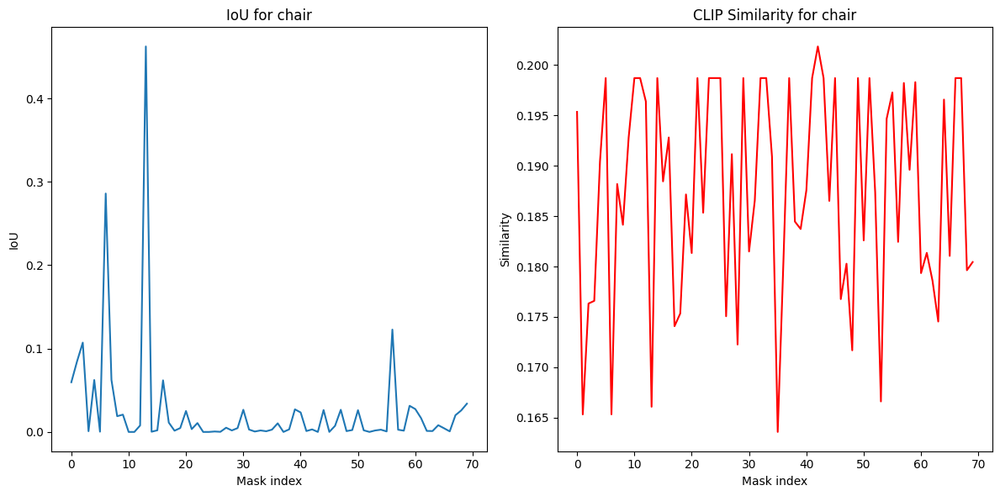

Processing images:  40%|████      | 14/35 [53:36<1:07:09, 191.87s/it]

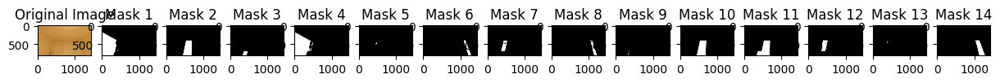

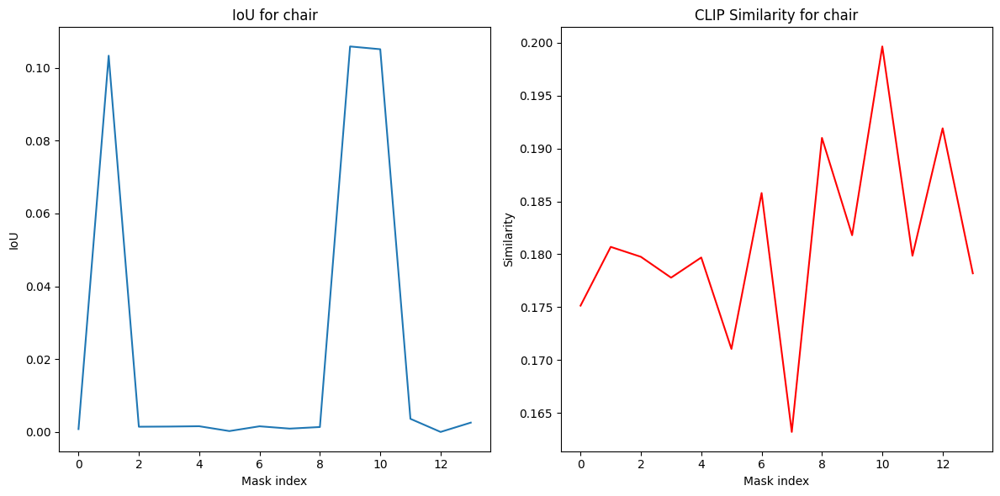

Processing images:  43%|████▎     | 15/35 [54:35<50:37, 151.90s/it]  

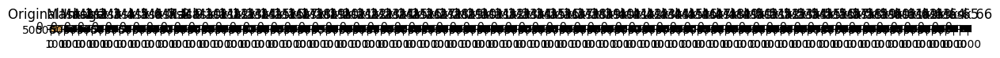

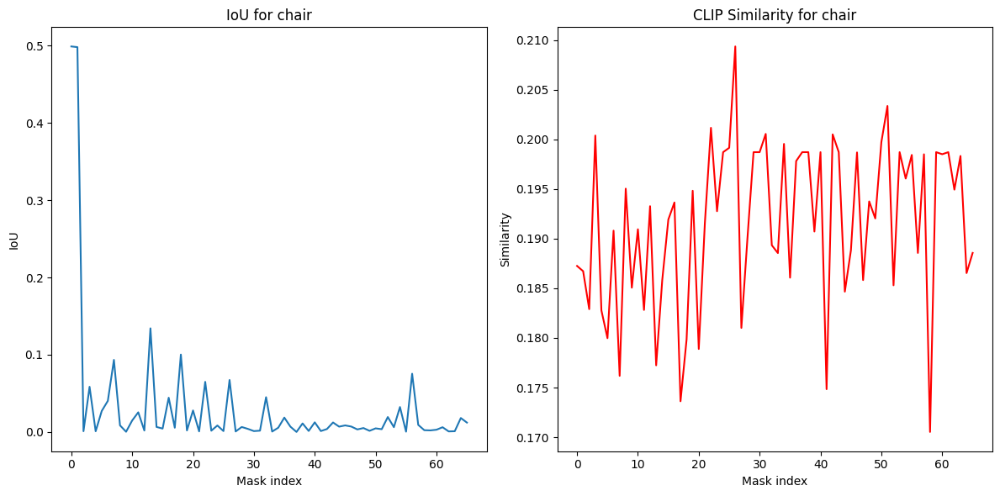

Processing images:  46%|████▌     | 16/35 [56:42<45:47, 144.61s/it]

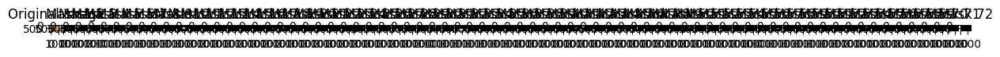

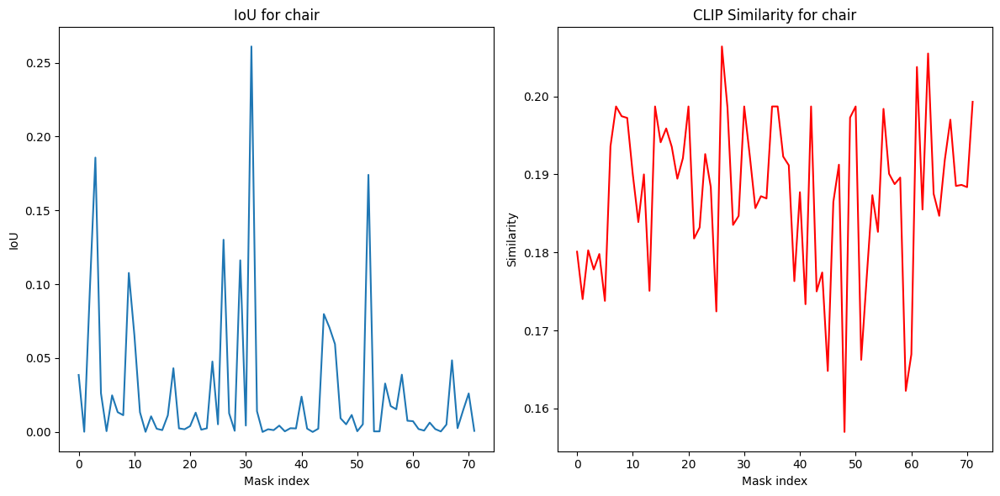

Processing images:  49%|████▊     | 17/35 [58:58<42:35, 141.96s/it]

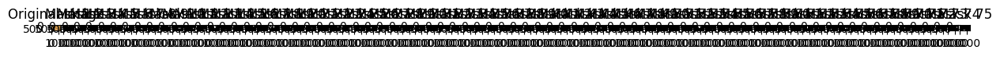

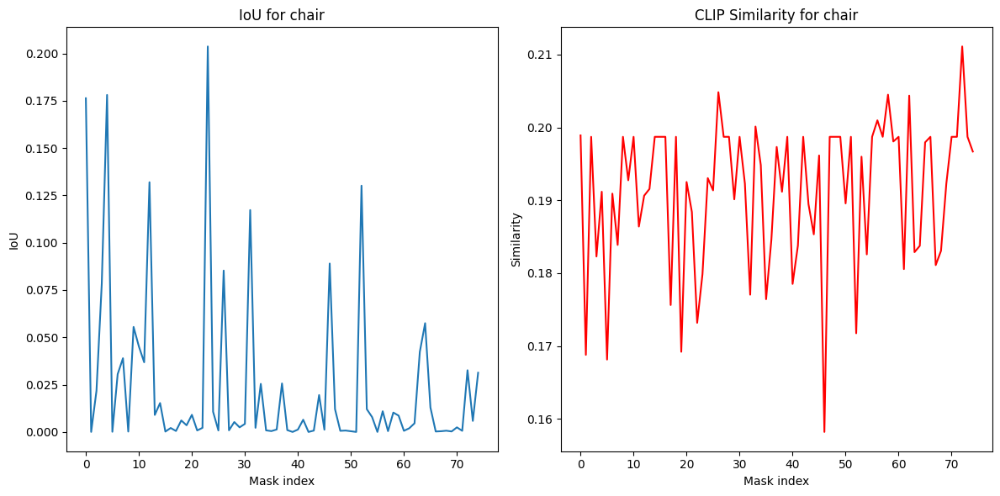

Processing images:  51%|█████▏    | 18/35 [1:01:17<39:57, 141.03s/it]

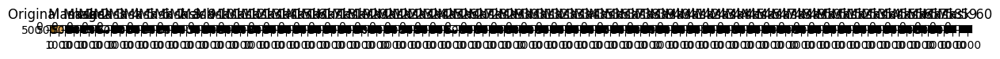

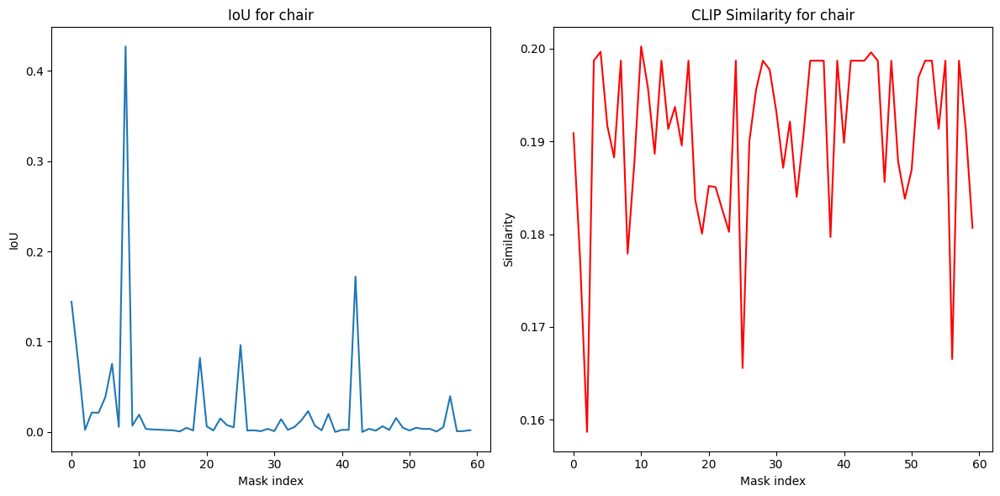

Processing images:  54%|█████▍    | 19/35 [1:03:24<36:26, 136.66s/it]

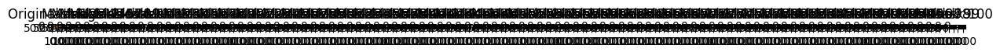

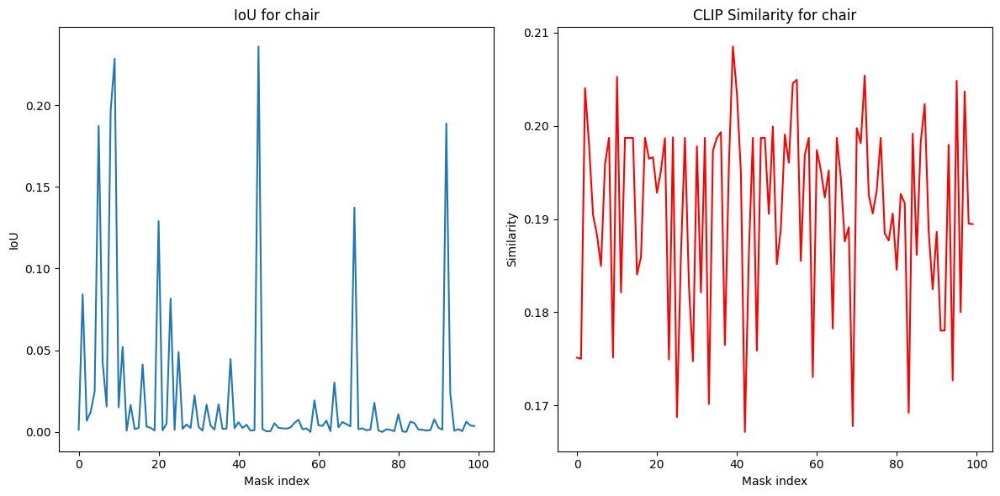

Processing images:  57%|█████▋    | 20/35 [1:06:38<38:29, 154.00s/it]

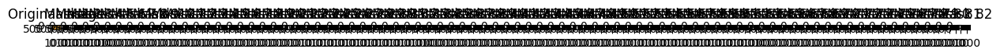

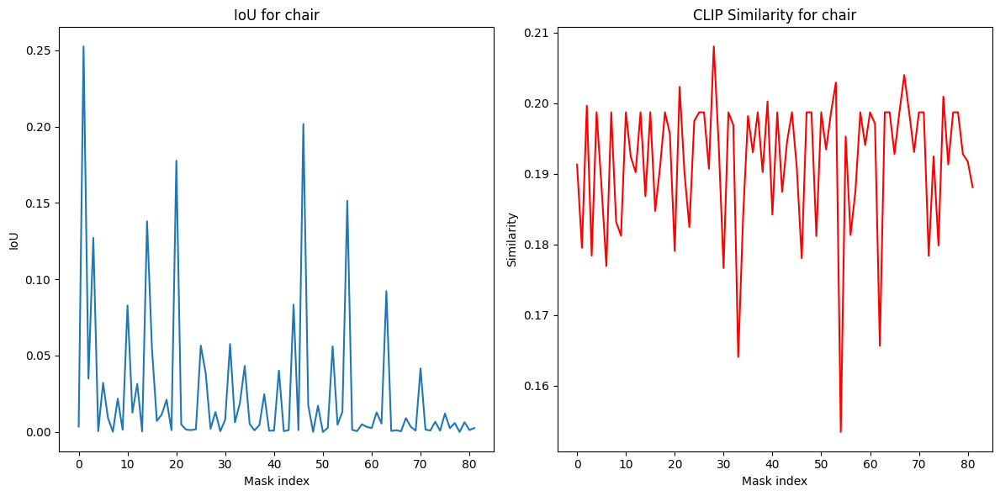

Processing images:  60%|██████    | 21/35 [1:09:10<35:45, 153.27s/it]

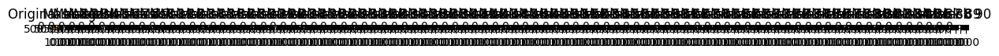

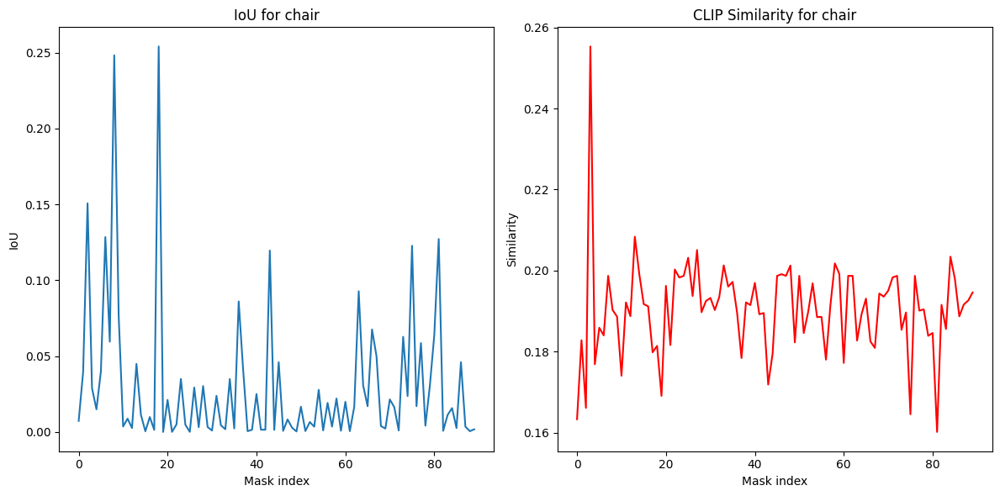

Processing images:  63%|██████▎   | 22/35 [1:12:03<34:32, 159.40s/it]

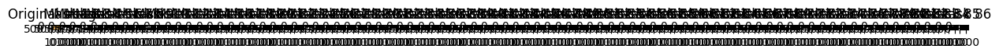

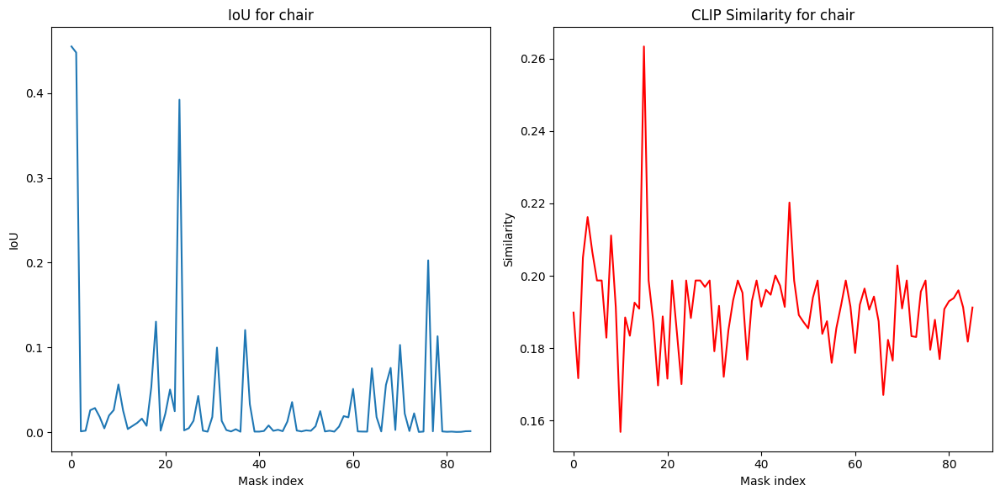

Processing images:  66%|██████▌   | 23/35 [1:14:52<32:27, 162.29s/it]

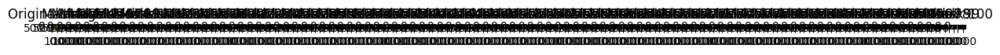

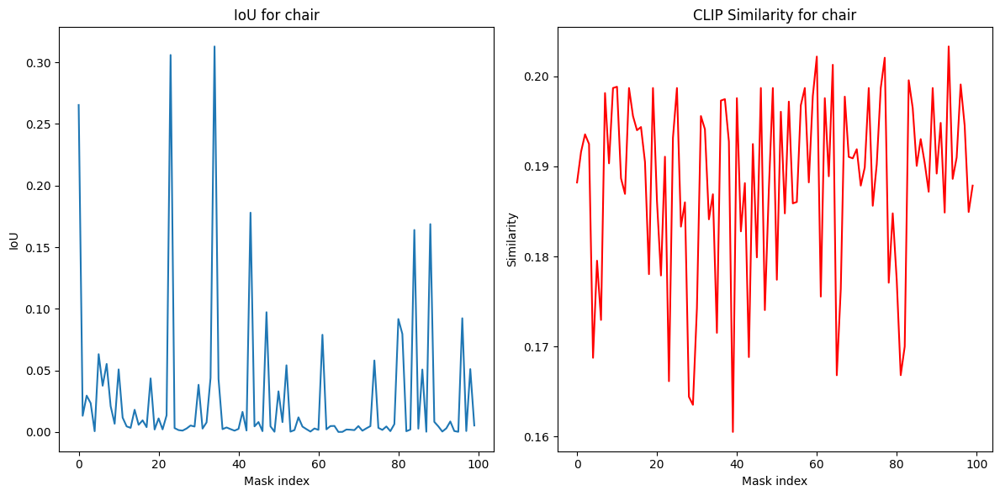

Processing images:  69%|██████▊   | 24/35 [1:17:57<31:00, 169.10s/it]

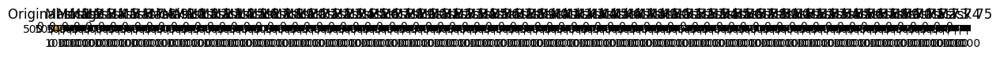

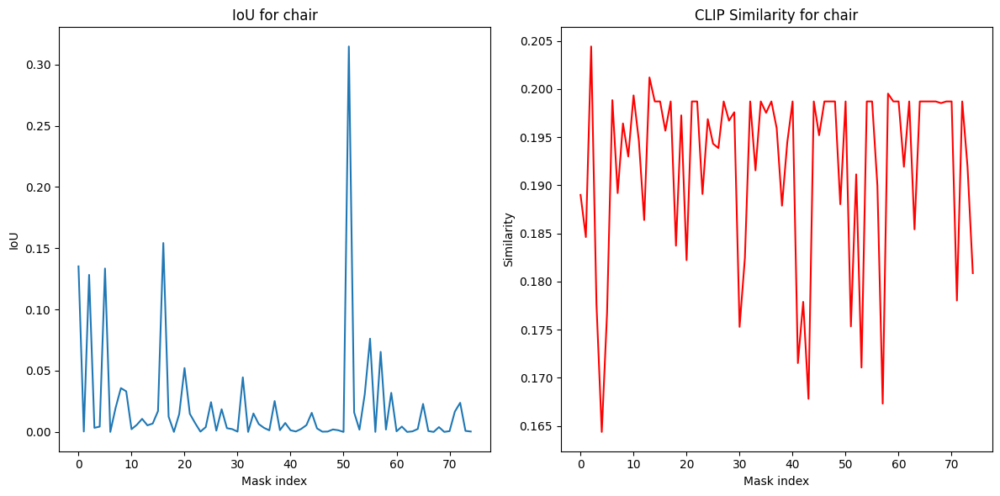

Processing images:  71%|███████▏  | 25/35 [1:20:18<26:45, 160.56s/it]

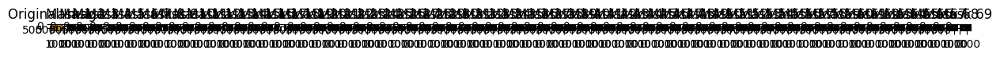

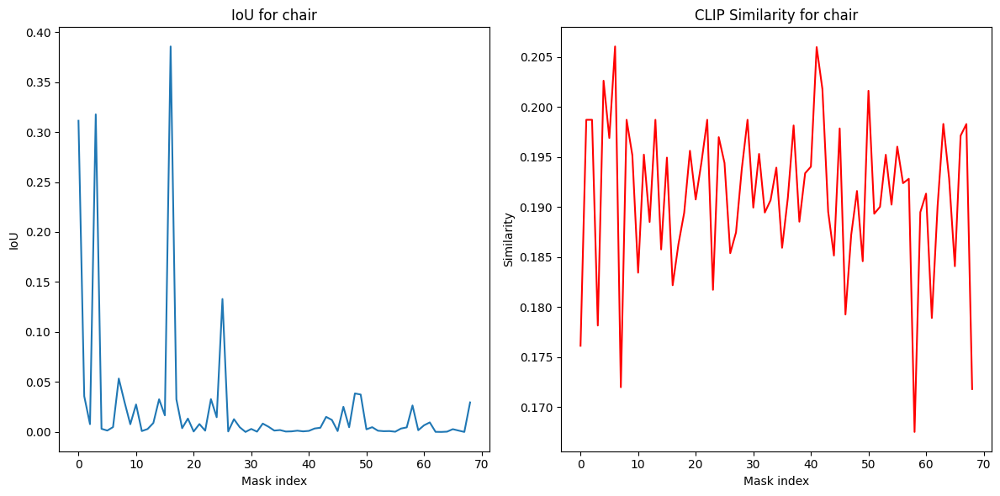

Processing images:  74%|███████▍  | 26/35 [1:22:23<22:30, 150.02s/it]

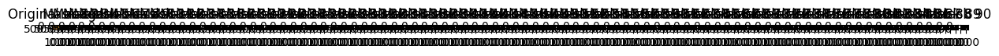

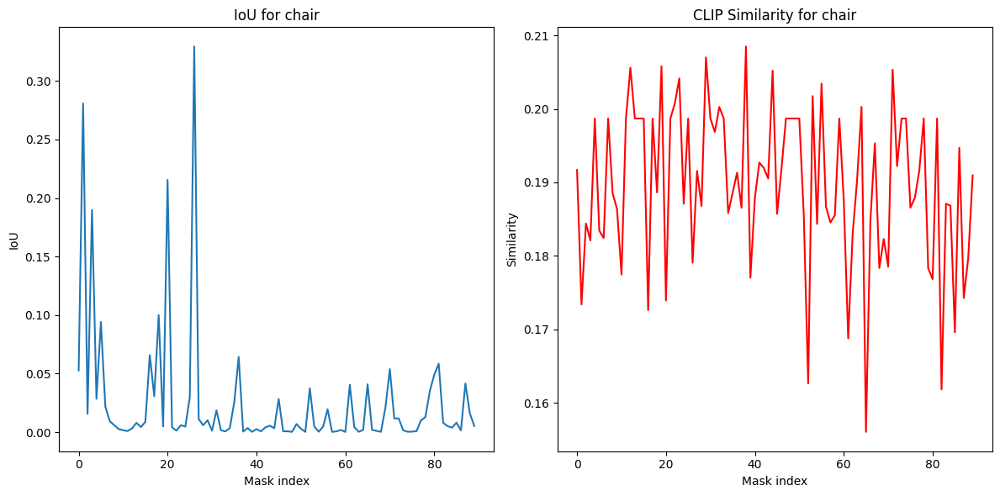

Processing images:  77%|███████▋  | 27/35 [1:25:12<20:44, 155.60s/it]

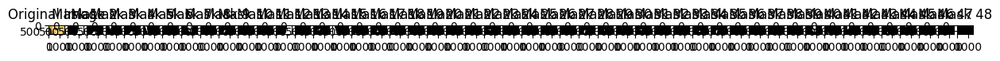

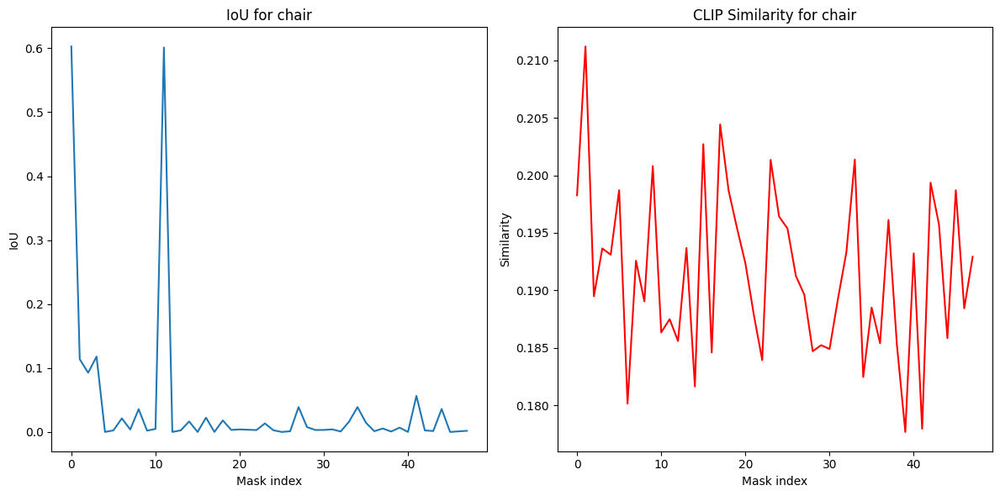

Processing images:  80%|████████  | 28/35 [1:26:46<16:00, 137.22s/it]

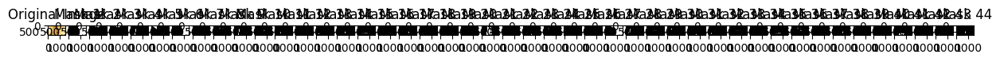

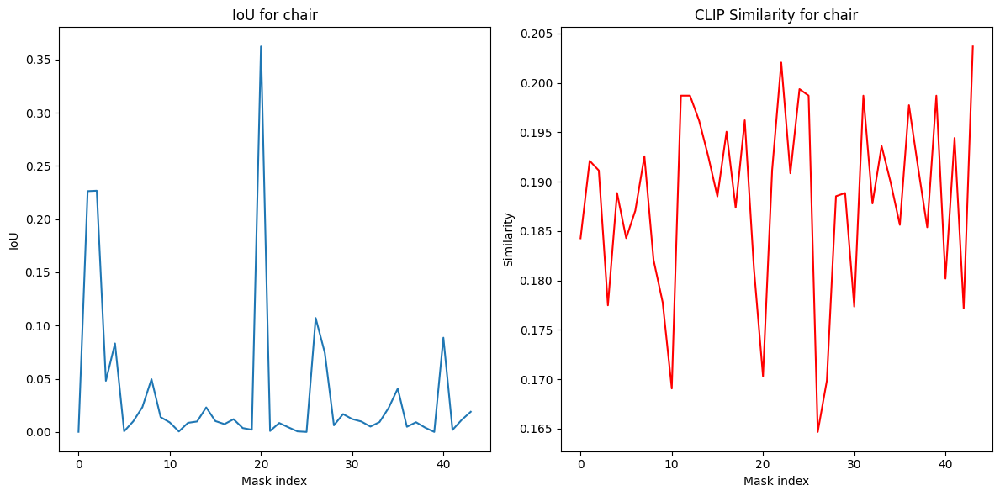

Processing images:  83%|████████▎ | 29/35 [1:28:16<12:17, 122.92s/it]

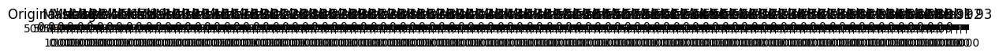

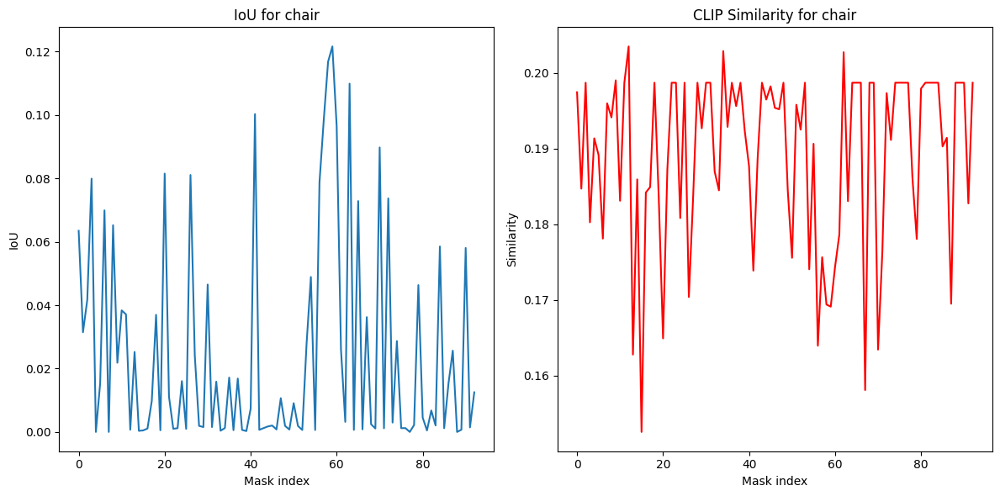

Processing images:  86%|████████▌ | 30/35 [1:31:11<11:33, 138.61s/it]

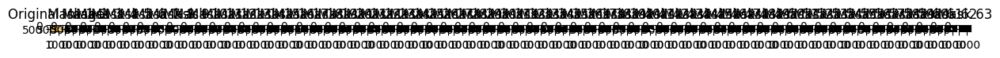

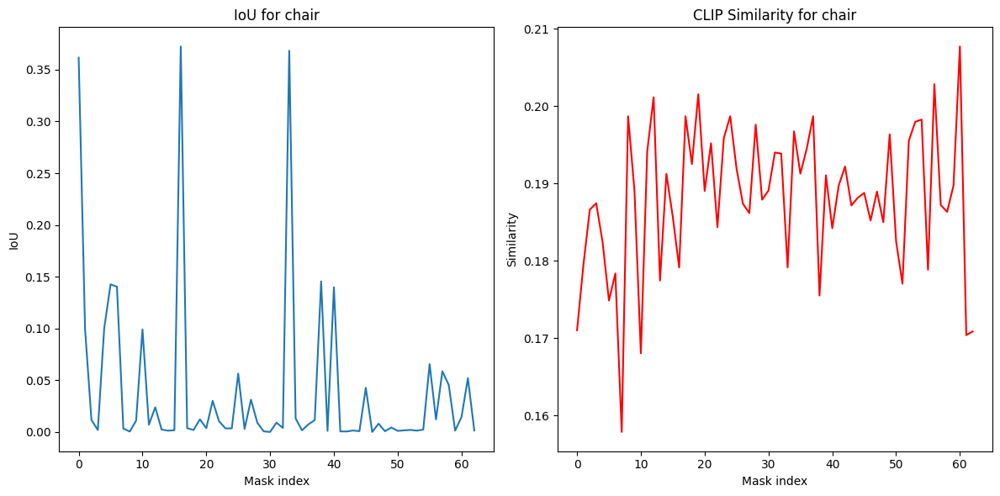

Processing images:  89%|████████▊ | 31/35 [1:33:24<09:07, 136.85s/it]

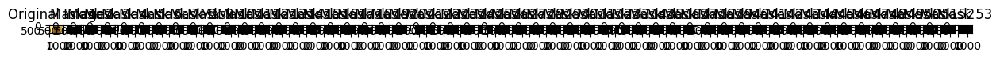

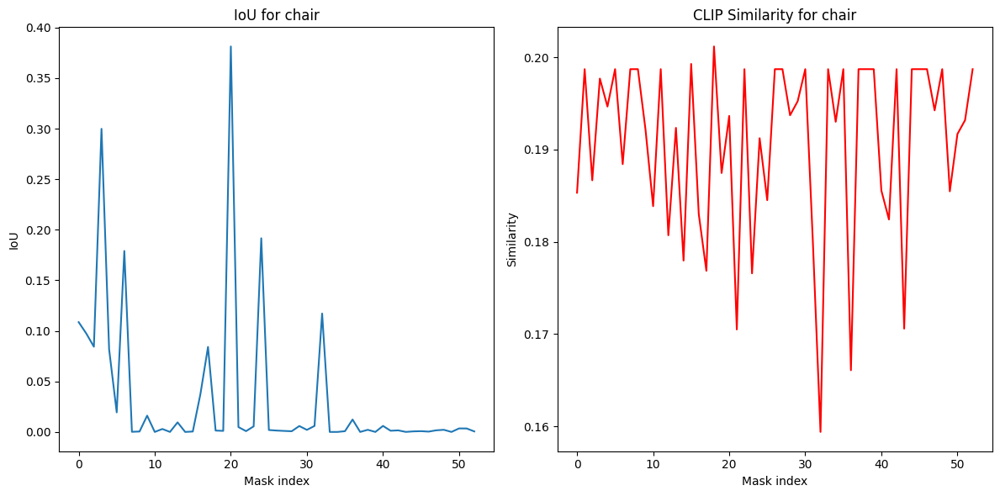

Processing images:  91%|█████████▏| 32/35 [1:35:14<06:26, 128.69s/it]

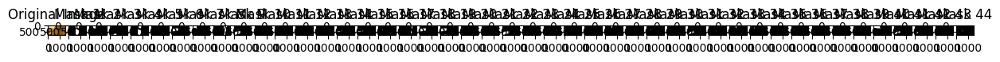

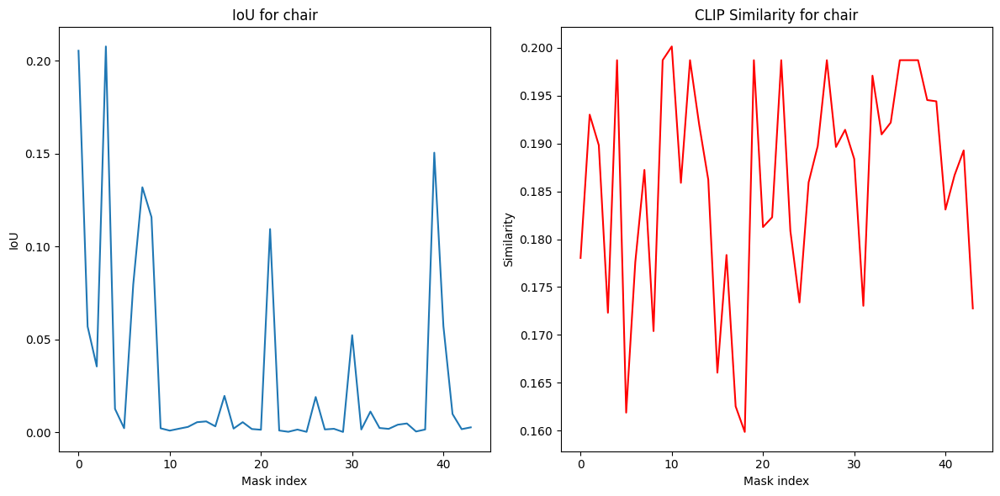

Processing images:  94%|█████████▍| 33/35 [1:36:41<03:52, 116.36s/it]

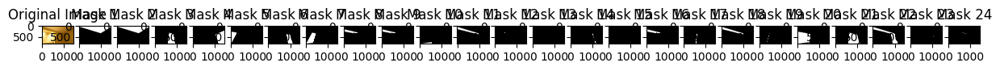

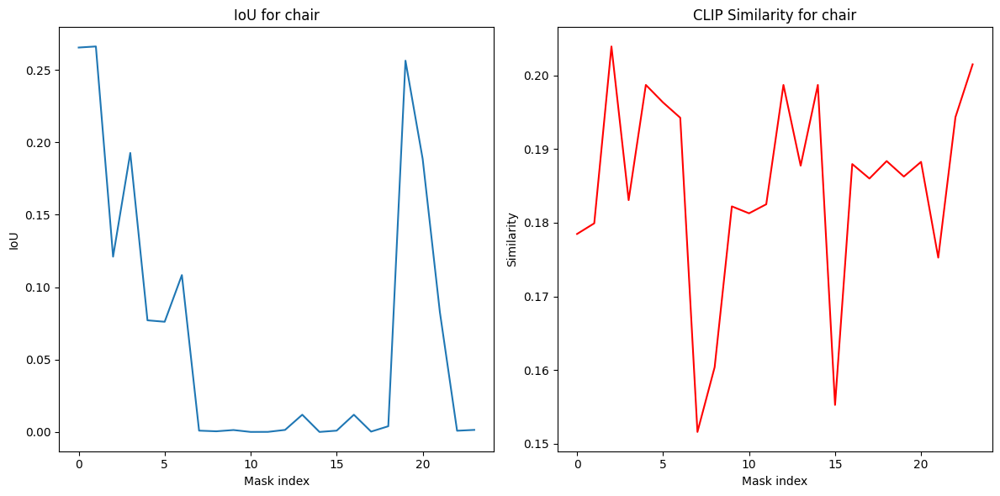

Processing images:  97%|█████████▋| 34/35 [1:37:47<01:41, 101.18s/it]

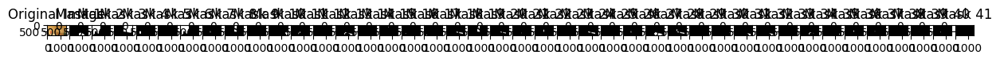

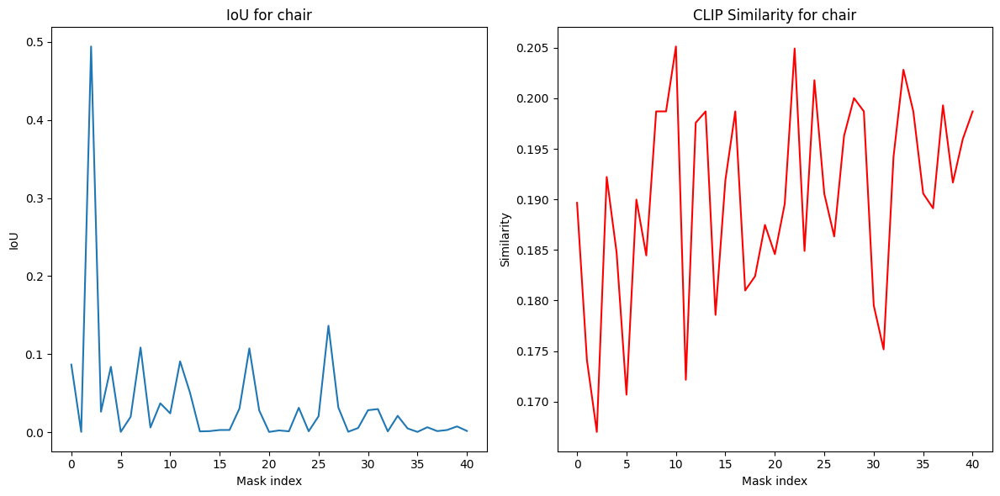

Processing images: 100%|██████████| 35/35 [1:39:15<00:00, 170.16s/it]


In [ ]:
import os
import torch
import numpy as np
import cv2
import clip
from PIL import Image
from tqdm import tqdm
from collections import defaultdict
import matplotlib.pyplot as plt
from sam2.build_sam import build_sam2
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator

#clip, most "powerfull" model
clip_model, preprocess = clip.load("ViT-L/14", device="cuda" if torch.cuda.is_available() else "cpu")

#SAM2 idk why but if i make .\checkpoints\sam2.1_hiera_large.pt it cant work at all, plz change link if you want to check code
checkpoint = r"C:\Users\Mi\OneDrive\Desktop\CV_HW2\checkpoints\sam2.1_hiera_large.pt"
model_cfg = r"C:\Users\Mi\OneDrive\Desktop\CV_HW2\checkpoints\sam2.1_hiera_l.yaml"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

sam2 = build_sam2(model_cfg, checkpoint, device=device, apply_postprocessing=True)

#Yes, here can be a lot of promts , but i havent enought time to calculate all promts for all images again (in experimental part you can check my plots how different promts works)
prompts = ["chair"]

def load_image(image_path):
    image = Image.open(image_path).convert("RGB")
    return np.array(image)

#Get clip
def get_clip_embedding(image):
    image_input = preprocess(Image.fromarray(image)).unsqueeze(0).to(device)
    with torch.no_grad():
        image_features = clip_model.encode_image(image_input)
    return image_features

#cos
def compute_similarity(embedding1, embedding2):
    return torch.cosine_similarity(embedding1, embedding2)

#there is is my best mask postprocessing... But idk, its not helping at all... :(
def postprocess_mask(mask, min_area=200, kernel_size=(5, 5), closing_iterations=3):
    "here i am try to delete holes and different distortions"
    mask = mask.astype(np.uint8)  
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(mask, connectivity=8)
    for label in range(1, num_labels):
        if stats[label, cv2.CC_STAT_AREA] < min_area:
            mask[labels == label] = 0

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kernel_size)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=closing_iterations)

    return mask

#connecting masks by prox to delete small useless masks
def combine_masks_by_proximity(masks, proximity_threshold=1):
    combined_masks = []
    for i, mask1 in enumerate(masks):
        if mask1.size == 0:
            continue
        merged = False
        for j, mask2 in enumerate(masks):
            if i != j and mask2.size != 0: 
                dist = np.linalg.norm(np.array(np.where(mask1)).mean(axis=1) - 
                                      np.array(np.where(mask2)).mean(axis=1))
                if dist < proximity_threshold:
                    combined_mask = np.logical_or(mask1, mask2).astype(np.uint8)
                    masks[i] = combined_mask
                    masks[j] = combined_mask
                    merged = True
                    break
        if not merged:
            combined_masks.append(mask1)
    return combined_masks

# mask connection
def process_masks(masks, image_shape, proximity_threshold=1):
    processed_masks = []
    for mask_data in masks:
        segmentation = mask_data.get("segmentation", np.zeros(image_shape, dtype=np.uint8))
        segmentation = postprocess_mask(segmentation)
        processed_masks.append(segmentation)

    return combine_masks_by_proximity(processed_masks, proximity_threshold)

#check how mask changed from your segmentation
def load_gt_mask(mask_path):
    return np.load(mask_path)

#IOU
def compute_iou(pred_mask, gt_mask):
    intersection = np.logical_and(pred_mask, gt_mask)
    union = np.logical_or(pred_mask, gt_mask)
    return np.sum(intersection) / np.sum(union)

def get_clip_mask_embedding(mask):
    mask_image = Image.fromarray(mask.astype(np.uint8) * 255)  #npy-jpg
    mask_embedding = get_clip_embedding(np.array(mask_image)) 
    return mask_embedding

#every image
def process_directory(input_dir, mask_dir, output_dir, proximity_threshold=1, step=10, iou_threshold=0.5):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    image_files = sorted(
        [f for f in os.listdir(input_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
    )
    image_files = image_files[::step]  #10

    all_metrics = defaultdict(lambda: defaultdict(list))
    log_file = open(os.path.join(output_dir, "log.txt"), "w")

    for image_file in tqdm(image_files, desc="Processing images"):
        image_path = os.path.join(input_dir, image_file)
        image_rgb = load_image(image_path)

        #secret sam2 wearpon
        mask_generator = SAM2AutomaticMaskGenerator(
            sam2,
            points_per_side=32,
            points_per_batch=64,
            pred_iou_thresh=0.3,
            stability_score_thresh=0.7,
            min_mask_region_area=50.0,
        )
        
        with torch.inference_mode():
            sam_result = mask_generator.generate(image_rgb)

        processed_masks = process_masks(sam_result, image_rgb.shape[:2], proximity_threshold=proximity_threshold)

        #save mask for future
        for prompt in prompts:
            text_embedding = clip_model.encode_text(clip.tokenize([prompt]).to(device))
            
            for i, mask in enumerate(processed_masks):
                mask_embedding = get_clip_mask_embedding(mask)
                similarity = compute_similarity(text_embedding, mask_embedding).item()

                #check with true mask
                gt_mask_path = os.path.join(mask_dir, f"{os.path.splitext(image_file)[0]}.npy")
                if os.path.exists(gt_mask_path):
                    gt_mask = load_gt_mask(gt_mask_path)
                    iou = compute_iou(mask, gt_mask)

                    #log file to not to start this 1000000 year code again
                    log_file.write(f"Image: {image_file}, Prompt: {prompt}, Mask {i}, IoU: {iou:.4f}, Similarity: {similarity:.4f}\n")
                    all_metrics[image_file][prompt].append({
                        "iou": iou,
                        "similarity": similarity
                    })

        plot_images(image_rgb, processed_masks, image_file, all_metrics)

    log_file.close()
    return all_metrics

#Plots for every image
def plot_images(image, masks, image_file, all_metrics):
    fig, axes = plt.subplots(1, len(masks) + 1, figsize=(15, 5))
    axes[0].imshow(image)
    axes[0].set_title(f"Original Image")
    
    for i, mask in enumerate(masks):
        axes[i+1].imshow(mask, cmap="gray")
        axes[i+1].set_title(f"Mask {i+1}")
    
    plt.show()

    #IOU +SIM
    for prompt in prompts:
        ious = [metric["iou"] for metric in all_metrics[image_file][prompt]]
        similarities = [metric["similarity"] for metric in all_metrics[image_file][prompt]]

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
        ax1.plot(ious, label="IoU")
        ax1.set_title(f"IoU for {prompt}")
        ax1.set_xlabel("Mask index")
        ax1.set_ylabel("IoU")

        ax2.plot(similarities, label="CLIP Similarity", color="red")
        ax2.set_title(f"CLIP Similarity for {prompt}")
        ax2.set_xlabel("Mask index")
        ax2.set_ylabel("Similarity")

        plt.tight_layout()
        plt.show()

input_dir = ".\images_0a7cc"
mask_dir = ".\gt_semantic_2d\render_semantic_npy"
output_dir = ".\output"

all_metrics = process_directory(input_dir, mask_dir, output_dir)


In [ ]:
import os
import torch
import numpy as np
import cv2
import clip
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt
from sam2.build_sam import build_sam2
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator

clip_model, preprocess = clip.load("ViT-L/14", device="cuda" if torch.cuda.is_available() else "cpu")

checkpoint = r"C:\Users\Mi\OneDrive\Desktop\CV_HW2\checkpoints\sam2.1_hiera_large.pt"
model_cfg = r"C:\Users\Mi\OneDrive\Desktop\CV_HW2\checkpoints\sam2.1_hiera_l.yaml"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

sam2 = build_sam2(model_cfg, checkpoint, device=device, apply_postprocessing=False)

prompts = ["chair"]

def load_image(image_path):
    image = Image.open(image_path).convert("RGB")
    return np.array(image)

def get_clip_embedding(image):
    image_input = preprocess(Image.fromarray(image)).unsqueeze(0).to(device)
    with torch.no_grad():
        image_features = clip_model.encode_image(image_input)
    return image_features

def generate_masks(image):
    mask_generator = SAM2AutomaticMaskGenerator(
        sam2,
        points_per_side=32,
        points_per_batch=64,
        pred_iou_thresh=0.3,
        stability_score_thresh=0.7,
        min_mask_region_area=50.0,
    )
    
    with torch.inference_mode():
        sam_result = mask_generator.generate(image)
        
    return sam_result  # List of masks

def combine_masks_colorfully(masks, image_shape):
    color_mask = np.zeros((image_shape[0], image_shape[1], 3), dtype=np.uint8)
    colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0), (0, 255, 255)] 
    
    for i, mask in enumerate(masks):
        color = colors[i % len(colors)]  # Rotate through the colors
        color_mask[mask == 1] = color  # Apply the color to the mask
    
    return color_mask

def process_directory(input_dir, mask_dir, output_dir, proximity_threshold=1, step=10):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    image_files = sorted(
        [f for f in os.listdir(input_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
    )
    image_files = image_files[::step] 
    for image_file in tqdm(image_files, desc="Processing images"):
        image_path = os.path.join(input_dir, image_file)
        image_rgb = load_image(image_path)

        sam_result = generate_masks(image_rgb)

        image_output_dir = os.path.join(output_dir, os.path.splitext(image_file)[0])
        if not os.path.exists(image_output_dir):
            os.makedirs(image_output_dir)

        for i, mask_data in enumerate(sam_result):
            mask = mask_data.get("segmentation", np.zeros(image_rgb.shape[:2], dtype=np.uint8))
            mask_output_path = os.path.join(image_output_dir, f"mask_{i}.npy")
            np.save(mask_output_path, mask) 
        combined_mask = combine_masks_colorfully([mask_data.get("segmentation", np.zeros(image_rgb.shape[:2], dtype=np.uint8)) for mask_data in sam_result], image_rgb.shape)
        combined_mask_output_path = os.path.join(image_output_dir, "combined_mask.jpg")
        cv2.imwrite(combined_mask_output_path, combined_mask)  

        overlayed_image = cv2.addWeighted(image_rgb, 0.7, combined_mask, 0.3, 0)
        overlayed_image_path = os.path.join(image_output_dir, "overlayed_image.jpg")
        cv2.imwrite(overlayed_image_path, overlayed_image)
input_dir = r".\images_0a7cc"
mask_dir = r".\gt_semantic_2d\render_semantic_npy"
output_dir = r".\output"

process_directory(input_dir, mask_dir, output_dir)


Using device: cpu


Processing images: 100%|██████████| 35/35 [1:37:08<00:00, 166.52s/it]


In [ ]:
import numpy as np
import os
from pathlib import Path
output_dir = Path("./output")
for sub_dir in output_dir.iterdir():
    if sub_dir.is_dir():
        combined_mask = None
        mask_files = sorted([f for f in sub_dir.glob("mask_*.npy")])
        for mask_file in mask_files:
            mask = np.load(mask_file)
            if combined_mask is None:
                combined_mask = mask
            else:
                combined_mask = np.maximum(combined_mask, mask)
        combined_mask_file = sub_dir / "combined_mask.npy"
        np.save(combined_mask_file, combined_mask)


no combined_masks mask.
IoU  DSC05827: 0.5133
IoU  DSC05837: 0.5275
IoU  DSC05847: 0.5032
IoU  DSC05857: 0.6138
IoU  DSC05867: 0.6012
IoU  DSC05877: 0.5327
IoU  DSC05887: 0.4870
IoU  DSC05897: 0.6064
IoU  DSC05907: 0.7350
IoU  DSC05917: 0.6089
IoU  DSC05927: 0.5957
IoU  DSC05937: 0.6927
IoU  DSC05947: 0.6259
IoU  DSC05957: 0.5714
IoU  DSC05967: 0.6412
IoU  DSC05977: 0.5234
IoU  DSC05987: 0.4933
IoU  DSC05997: 0.6031
IoU  DSC06007: 0.5865
IoU  DSC06017: 0.5984
IoU  DSC06027: 0.5919
IoU  DSC06037: 0.5555
IoU  DSC06047: 0.6653
IoU  DSC06057: 0.7209
IoU  DSC06067: 0.7442
IoU  DSC06077: 0.8004
IoU  DSC06087: 0.8824
IoU  DSC06097: 0.5100
IoU  DSC06107: 0.4420
IoU  DSC06117: 0.7214
IoU  DSC06127: 0.4720
IoU  DSC06156: 0.7136
IoU  DSC06166: 0.8952
IoU  DSC06176: 0.8674
IoU  DSC06188: 0.5781

Average IOU : 0.6234


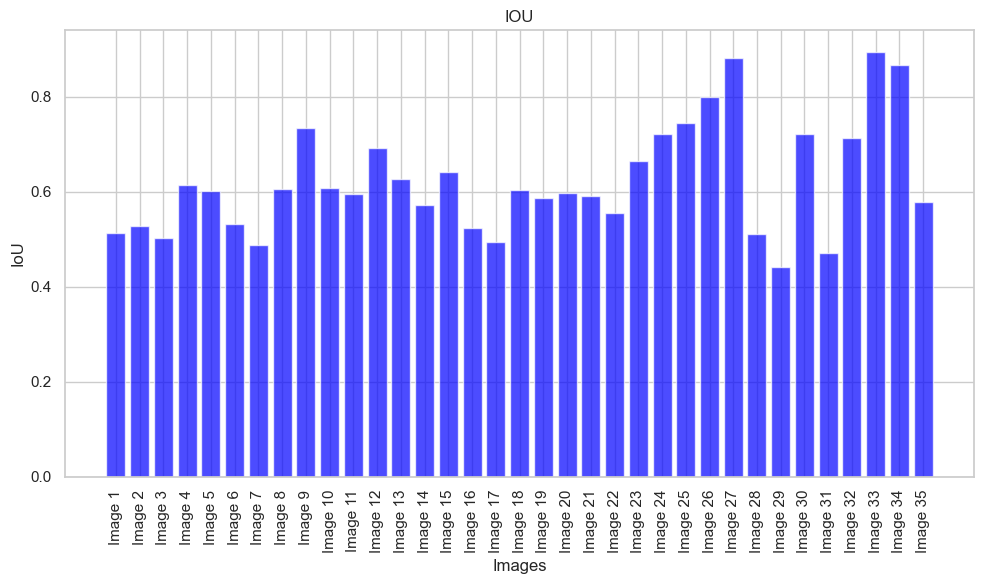

In [ ]:
import numpy as np
import os
from pathlib import Path
import matplotlib.pyplot as plt

def calculate_iou(pred_mask, gt_mask):
    intersection = np.logical_and(pred_mask, gt_mask).sum()
    union = np.logical_or(pred_mask, gt_mask).sum()
    if union == 0:
        return 0.0
    return intersection / union

output_dir = Path("./output")
gt_dir = Path("./gt_semantic_2d/render_semantic_npy")

ious = [] 

for sub_dir in output_dir.iterdir():
    if sub_dir.is_dir():
        combined_mask_file = sub_dir / "combined_mask.npy"
        if combined_mask_file.exists():
            pred_mask = np.load(combined_mask_file, allow_pickle=True) 
            gt_mask_file = gt_dir / f"{sub_dir.name}.npy"
            if gt_mask_file.exists():
                true_mask = np.load(gt_mask_file, allow_pickle=True)  
                

                iou = calculate_iou(pred_mask, true_mask)
                ious.append(iou)
                print(f"IoU  {sub_dir.name}: {iou:.4f}")
            else:
                print(f"no {sub_dir.name} mask.")
        
average_iou = np.mean(ious)
print(f"\nAverage IOU : {average_iou:.4f}")

plt.figure(figsize=(10, 6))
plt.bar(range(len(ious)), ious, color='blue', alpha=0.7)
plt.xlabel('Images')
plt.ylabel('IoU')
plt.title('IOU')
plt.xticks(range(len(ious)), [f"Image {i+1}" for i in range(len(ious))], rotation=90)
plt.tight_layout()
plt.show()


eror C:\Users\Mi\OneDrive\Desktop\CV_HW2\output\combined_masks\combined_mask.npy: unsupported operand type(s) for *: 'NoneType' and 'int'
{(35, 25)}


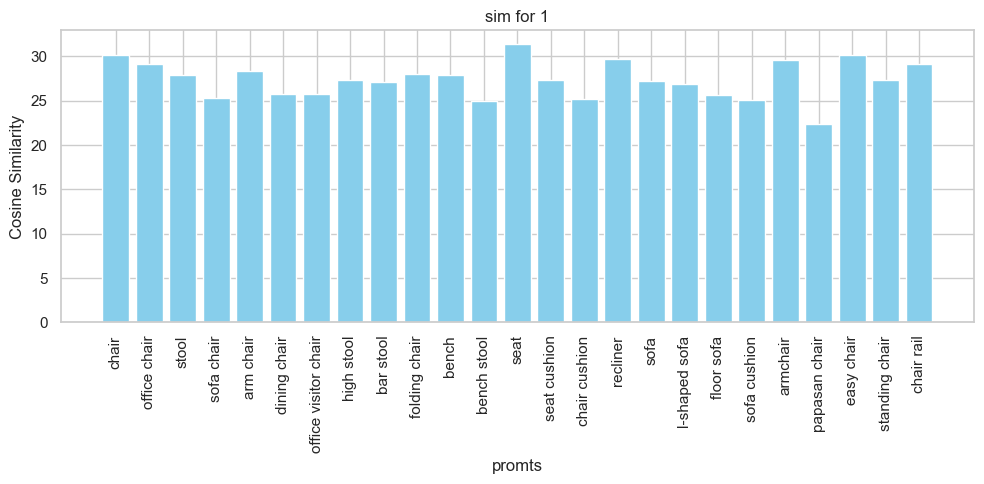

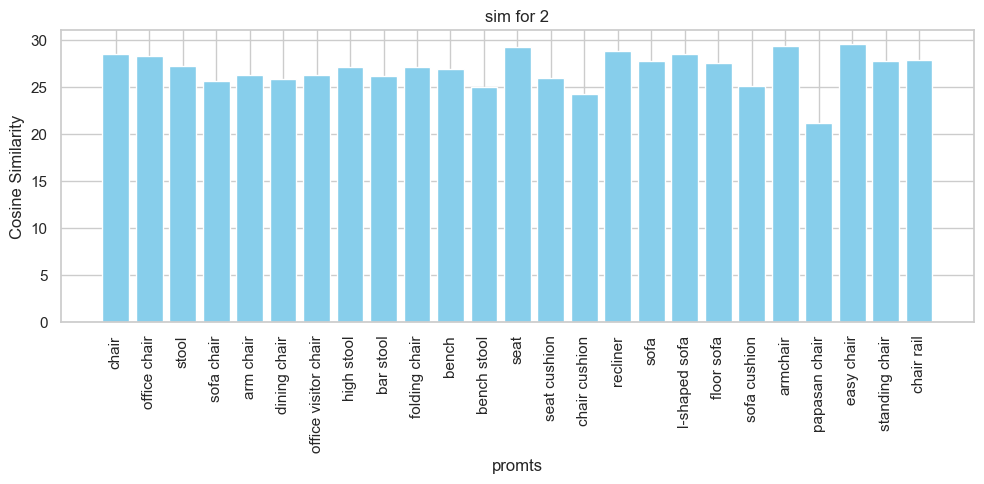

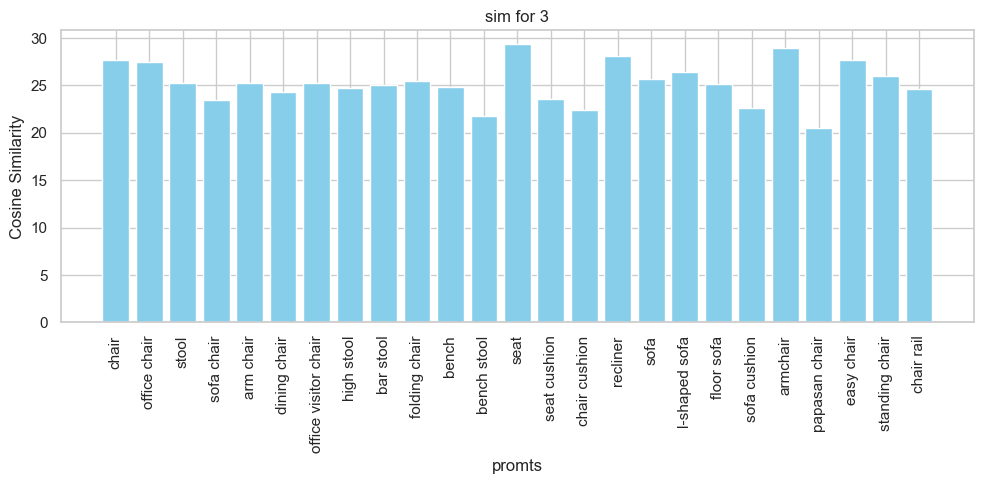

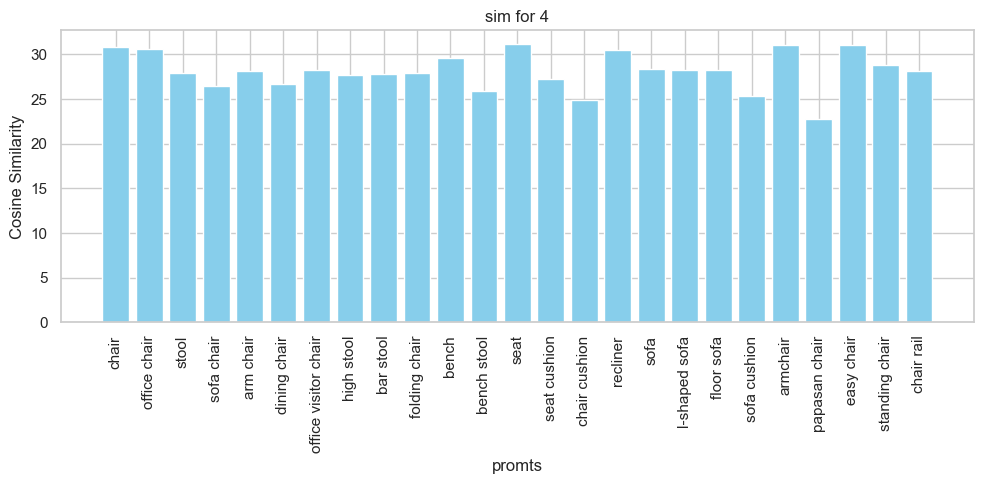

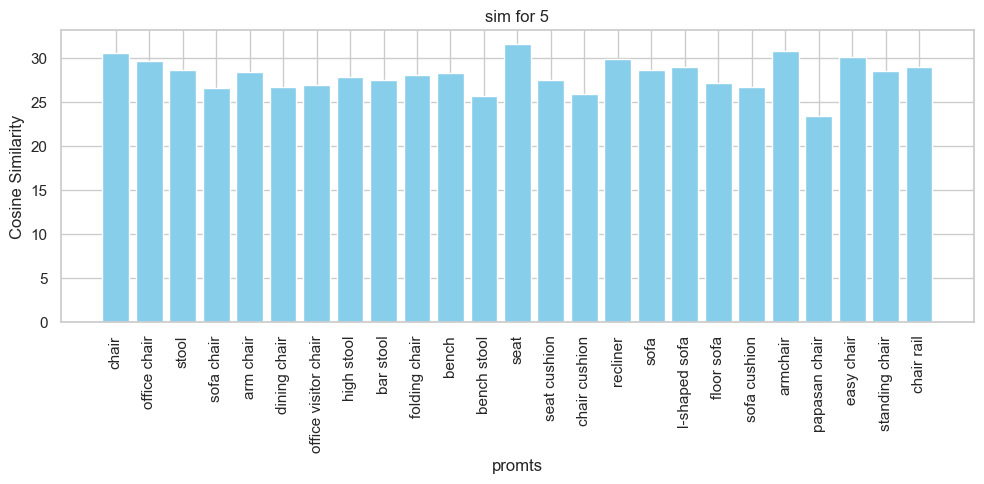

...

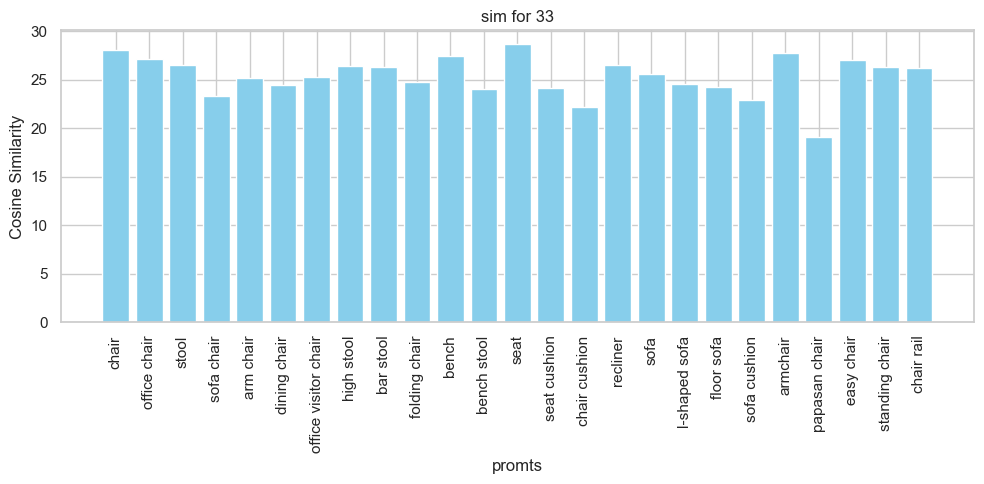

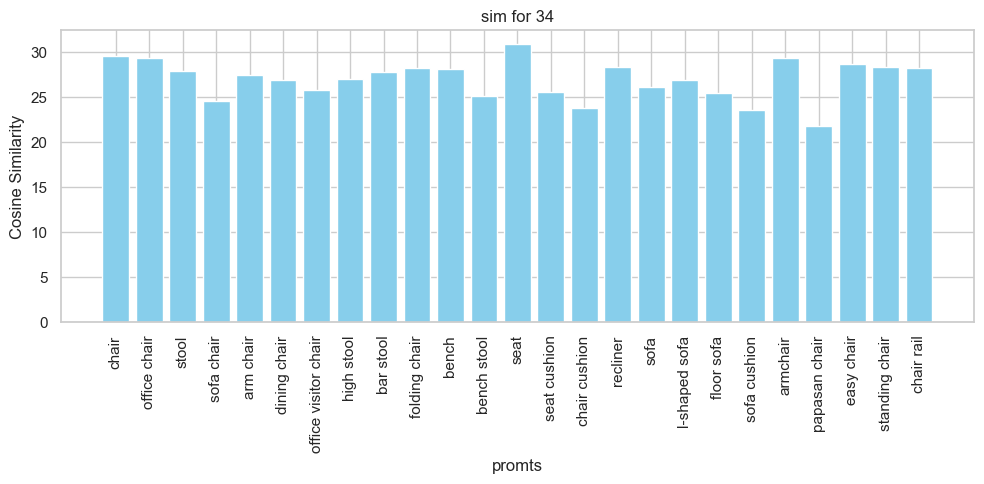

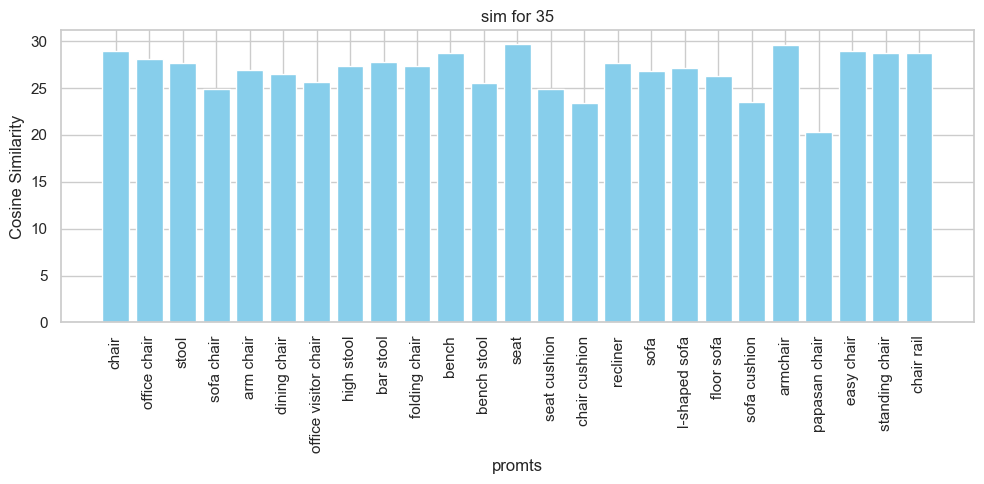

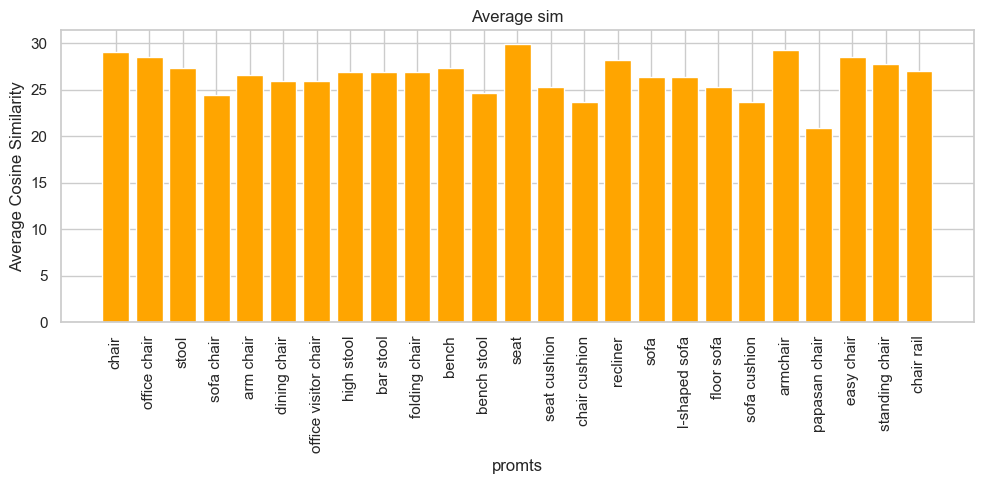

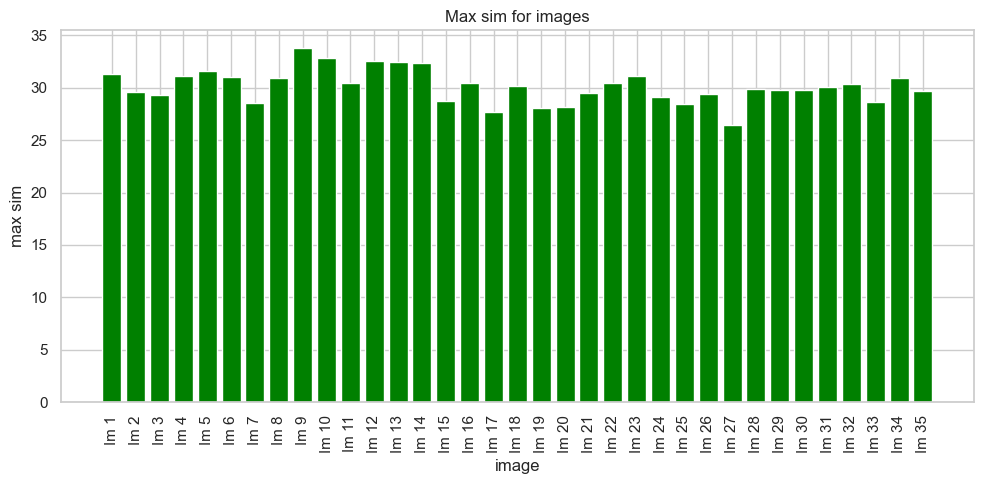

In [ ]:
import numpy as np
import torch
import clip
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt

device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device)

prompts = [
    "chair", "office chair", "stool", "sofa chair", "arm chair", "dining chair", 
    "office visitor chair", "high stool", "bar stool", "folding chair", "bench", 
    "bench stool", "seat", "seat cushion", "chair cushion", "recliner", "sofa", 
    "l-shaped sofa", "floor sofa", "sofa cushion", "armchair", "papasan chair", 
    "easy chair", "standing chair", "chair rail"]

similarities = []
output_dir = "./output"

for sub_dir in Path(output_dir).iterdir():
    if sub_dir.is_dir():
        img_file = sub_dir / "combined_mask.npy"
        if img_file.exists():
            pred_mask = np.load(img_file, allow_pickle=True)

            try:
                img = Image.fromarray((pred_mask * 255).astype(np.uint8))
            except Exception as e:
                print(f"Error {img_file}: {e}")
                continue

            img_input = preprocess(img).unsqueeze(0).to(device)

            with torch.no_grad():
                img_features = model.encode_image(img_input)

            prompt_features = []
            for prompt in prompts:
                text_input = clip.tokenize([prompt]).to(device)
                with torch.no_grad():
                    text_features = model.encode_text(text_input)
                prompt_features.append(text_features)

            similarities_for_image = []
            for prompt_feature in prompt_features:
                similarity = (img_features @ prompt_feature.T).item()  
                similarities_for_image.append(similarity)

            similarities.append(similarities_for_image)

similarities = np.array(similarities)
print(f"Shape of similarities: {similarities.shape}")

if similarities.ndim == 2:
    for img_idx in range(similarities.shape[0]):
        plt.figure(figsize=(10, 5))
        plt.bar(prompts, similarities[img_idx], color='skyblue')
        plt.title(f"Similarity for Image {img_idx + 1}")
        plt.xlabel("Prompts")
        plt.ylabel("Cosine Similarity")
        plt.xticks(rotation=90) 
        plt.tight_layout()
        plt.show()

    avg_similarities = np.mean(similarities, axis=0)

    plt.figure(figsize=(10, 5))
    plt.bar(prompts, avg_similarities, color='orange')
    plt.title("Average Similarity Across Images")
    plt.xlabel("Prompts")
    plt.ylabel("Average Cosine Similarity")
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

    max_similarities = np.max(similarities, axis=1)
    max_sim_prompts = [prompts[np.argmax(sim)] for sim in similarities]

    plt.figure(figsize=(10, 5))
    plt.bar(range(len(max_similarities)), max_similarities, color='green')
    plt.xticks(range(len(max_similarities)), [f"Image {i + 1}" for i in range(len(max_similarities))], rotation=90)
    plt.title("Max Similarity for Images")
    plt.xlabel("Images")
    plt.ylabel("Max Similarity")
    plt.tight_layout()
    plt.show()
else:
    print("bLYA")


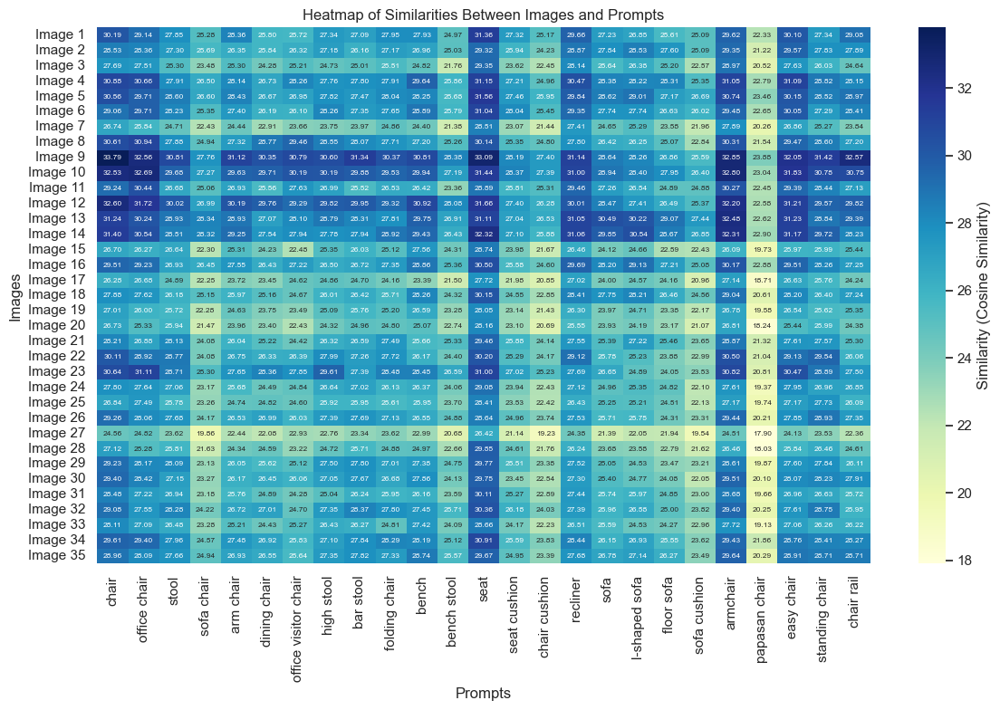

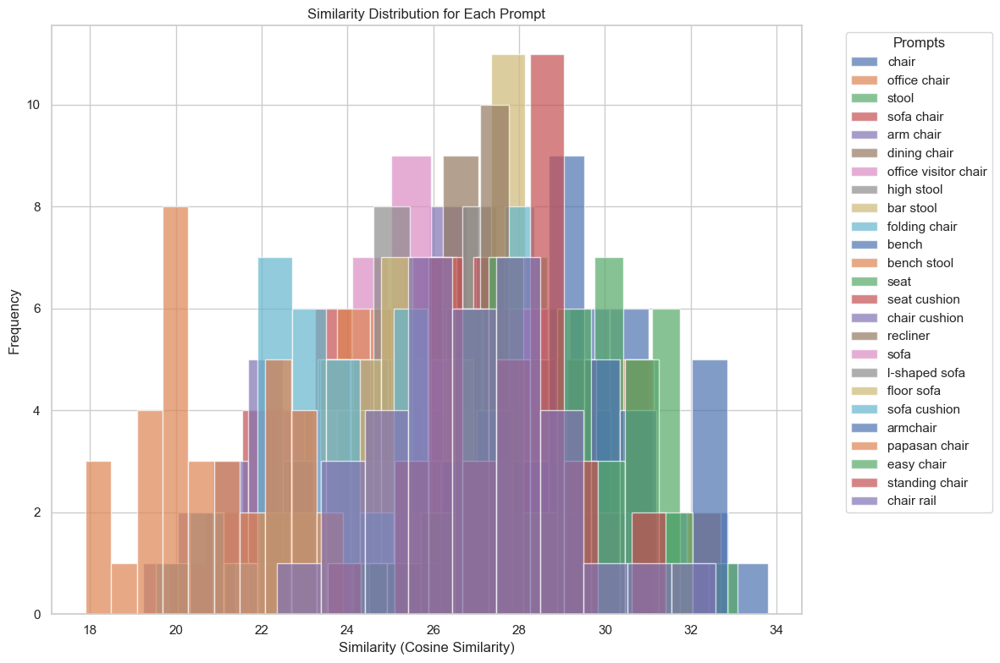

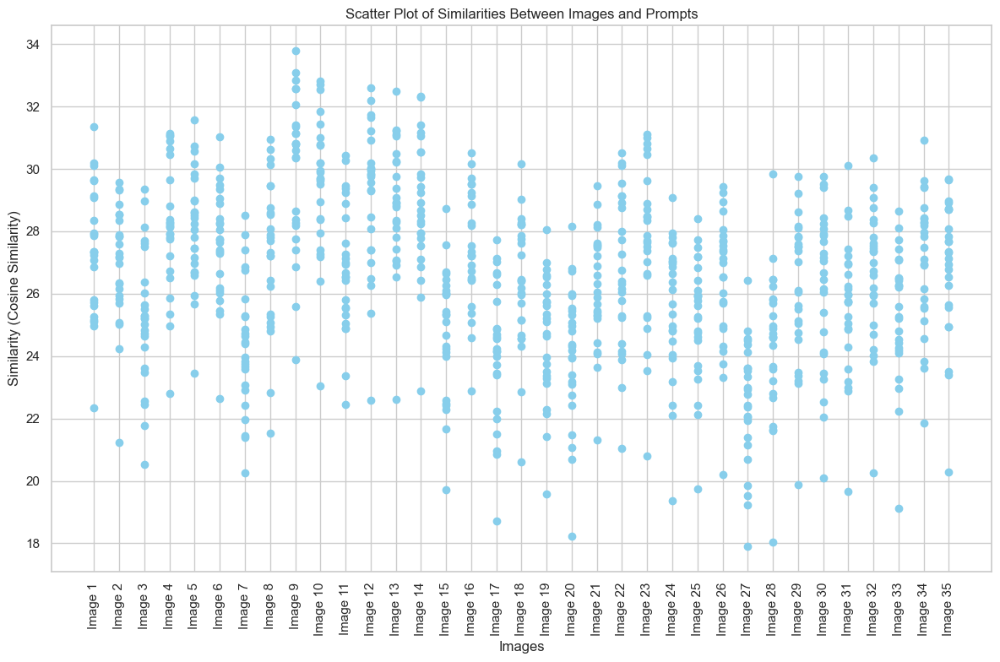

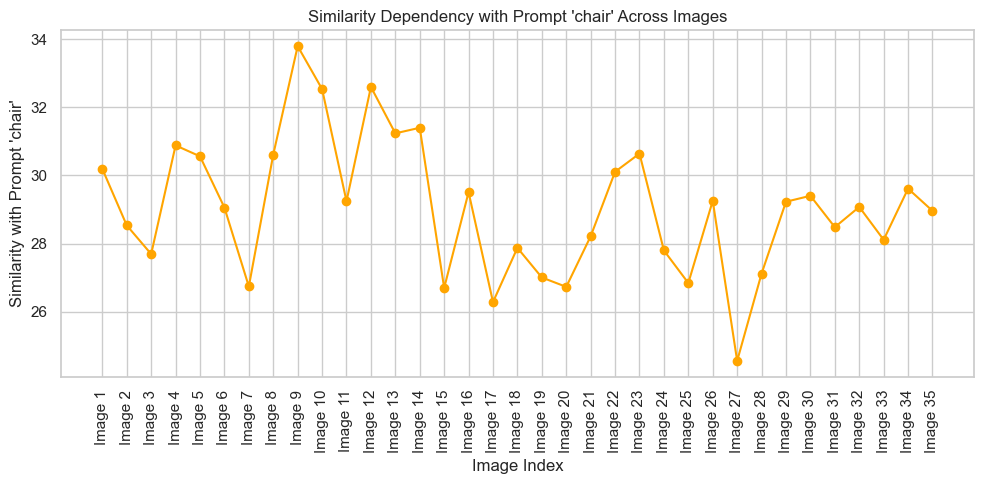

In [153]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(12, 8))
sns.heatmap(similarities, xticklabels=prompts, yticklabels=[f"Image {i+1}" for i in range(similarities.shape[0])],
            cmap="YlGnBu", annot=True, fmt=".2f", cbar_kws={'label': 'Similarity (Cosine Similarity)'},
            annot_kws={"size": 6})  
plt.title("Heatmap of Similarities Between Images and Prompts")
plt.xlabel("Prompts")
plt.ylabel("Images")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
for i, prompt in enumerate(prompts):
    plt.hist(similarities[:, i], bins=10, alpha=0.7, label=prompt)
plt.title("Similarity Distribution for Each Prompt")
plt.xlabel("Similarity (Cosine Similarity)")
plt.ylabel("Frequency")
plt.legend(title="Prompts", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
for i in range(similarities.shape[0]):
    plt.scatter([f"Image {i+1}"] * len(prompts), similarities[i], color='skyblue', label=f"Image {i+1}" if i == 0 else "")
plt.title("Scatter Plot of Similarities Between Images and Prompts")
plt.xlabel("Images")
plt.ylabel("Similarity (Cosine Similarity)")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

selected_prompt = "chair"
prompt_idx = prompts.index(selected_prompt)
plt.figure(figsize=(10, 5))
plt.plot(range(similarities.shape[0]), similarities[:, prompt_idx], marker='o', linestyle='-', color='orange')
plt.title(f"Similarity Dependency with Prompt '{selected_prompt}' Across Images")
plt.xlabel("Image Index")
plt.ylabel(f"Similarity with Prompt '{selected_prompt}'")
plt.xticks(range(similarities.shape[0]), [f"Image {i+1}" for i in range(similarities.shape[0])], rotation=90)
plt.tight_layout()
plt.show()


Error C:\Users\Mi\OneDrive\Desktop\CV_HW2\output\combined_masks\combined_mask.npy: unsupported operand type(s) for *: 'NoneType' and 'int'
Shape of similarities: (35, 20)


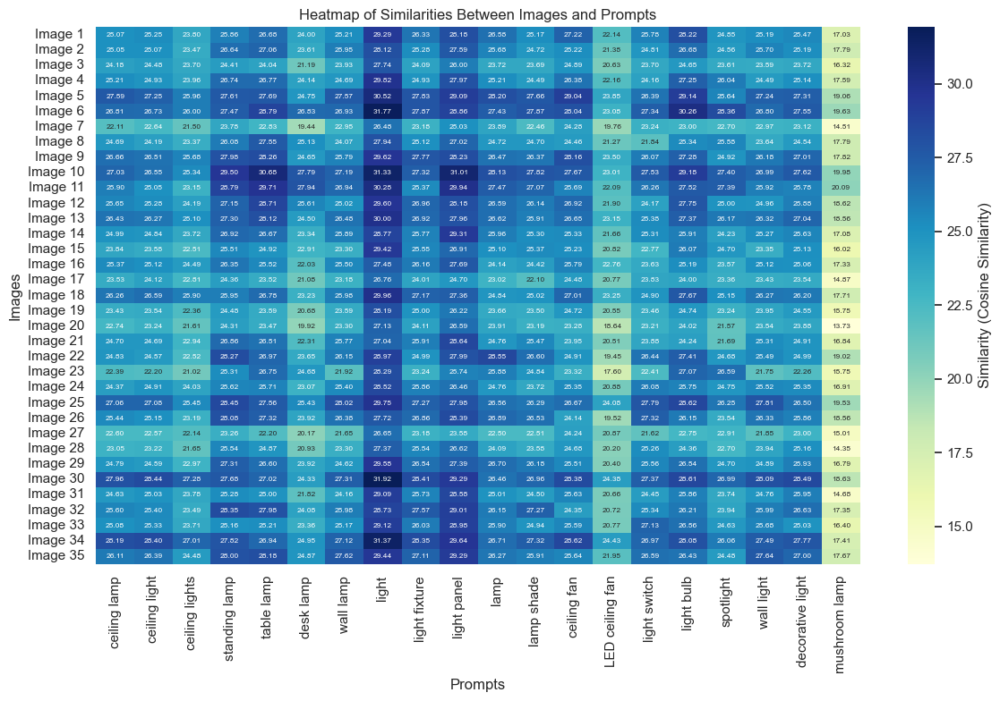

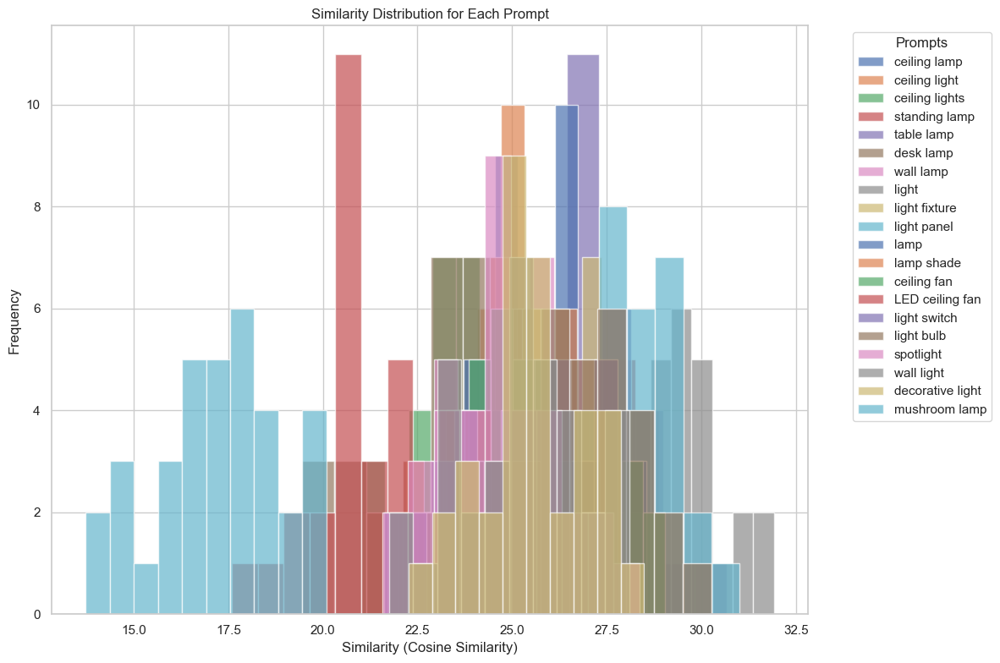

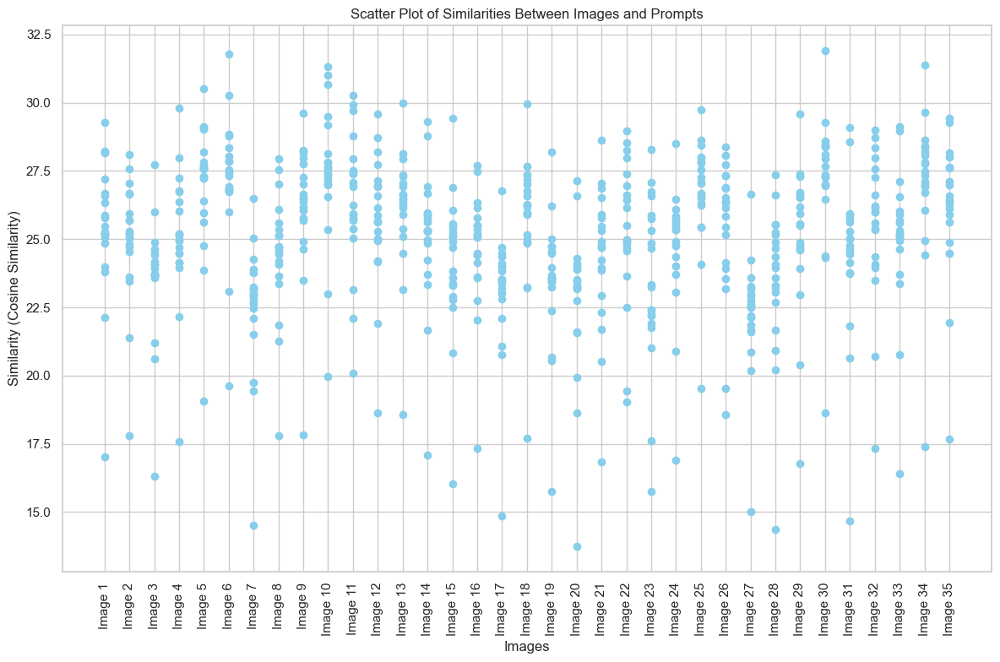

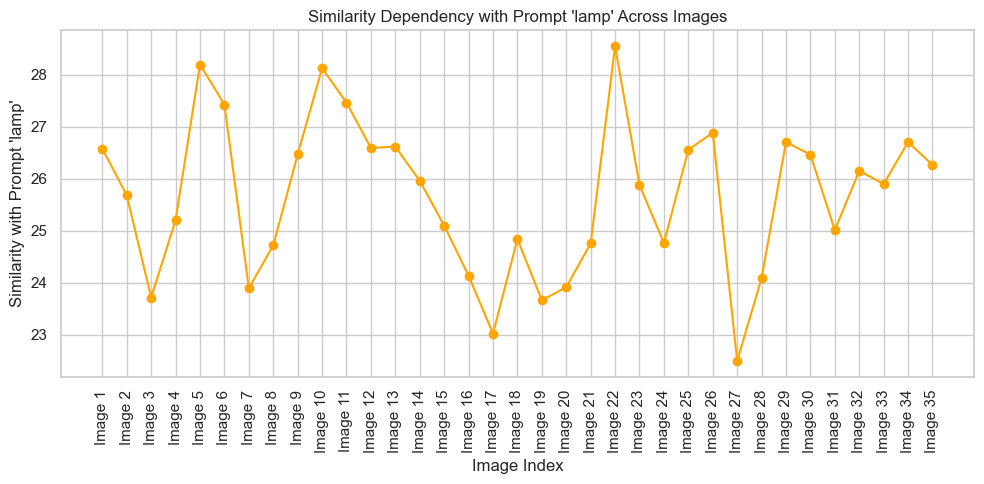

In [ ]:
import numpy as np
import torch
import clip
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns


device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device)

prompts = [
    "ceiling lamp", "ceiling light", "ceiling lights", "standing lamp", "table lamp", "desk lamp", 
    "wall lamp", "light", "light fixture", "light panel", "lamp", "lamp shade", "ceiling fan", 
    "LED ceiling fan", "light switch", "light bulb", "spotlight", "wall light", "decorative light", 
    "mushroom lamp"
]

similarities = []
output_dir = "./output"

for sub_dir in Path(output_dir).iterdir():
    if sub_dir.is_dir():
        img_file = sub_dir / "combined_mask.npy"
        if img_file.exists():
            pred_mask = np.load(img_file, allow_pickle=True)

            try:
                img = Image.fromarray((pred_mask * 255).astype(np.uint8))
            except Exception as e:
                print(f"Error {img_file}: {e}")
                continue

            img_input = preprocess(img).unsqueeze(0).to(device)

            with torch.no_grad():
                img_features = model.encode_image(img_input)

            prompt_features = []
            for prompt in prompts:
                text_input = clip.tokenize([prompt]).to(device)
                with torch.no_grad():
                    text_features = model.encode_text(text_input)
                prompt_features.append(text_features)

            similarities_for_image = []
            for prompt_feature in prompt_features:
                similarity = (img_features @ prompt_feature.T).item()
                similarities_for_image.append(similarity)

            similarities.append(similarities_for_image)

similarities = np.array(similarities)
print(f"Shape of similarities: {similarities.shape}")


plt.figure(figsize=(12, 8))
sns.heatmap(similarities, xticklabels=prompts, yticklabels=[f"Image {i+1}" for i in range(similarities.shape[0])],
            cmap="YlGnBu", annot=True, fmt=".2f", cbar_kws={'label': 'Similarity (Cosine Similarity)'},
            annot_kws={"size": 6})  
plt.title("Heatmap of Similarities Between Images and Prompts")
plt.xlabel("Prompts")
plt.ylabel("Images")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
for i, prompt in enumerate(prompts):
    plt.hist(similarities[:, i], bins=10, alpha=0.7, label=prompt)
plt.title("Similarity Distribution for Each Prompt")
plt.xlabel("Similarity (Cosine Similarity)")
plt.ylabel("Frequency")
plt.legend(title="Prompts", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
for i in range(similarities.shape[0]):
    plt.scatter([f"Image {i+1}"] * len(prompts), similarities[i], color='skyblue', label=f"Image {i+1}" if i == 0 else "")
plt.title("Scatter Plot of Similarities Between Images and Prompts")
plt.xlabel("Images")
plt.ylabel("Similarity (Cosine Similarity)")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

selected_prompt = "lamp"
prompt_idx = prompts.index(selected_prompt)
plt.figure(figsize=(10, 5))
plt.plot(range(similarities.shape[0]), similarities[:, prompt_idx], marker='o', linestyle='-', color='orange')
plt.title(f"Similarity Dependency with Prompt '{selected_prompt}' Across Images")
plt.xlabel("Image Index")
plt.ylabel(f"Similarity with Prompt '{selected_prompt}'")
plt.xticks(range(similarities.shape[0]), [f"Image {i+1}" for i in range(similarities.shape[0])], rotation=90)
plt.tight_layout()
plt.show()


Processing masks for DSC05827: 83it [01:18,  1.06it/s]
Processing masks for DSC05837: 83it [01:08,  1.22it/s]
Processing masks for DSC05847: 106it [02:57,  1.68s/it]
Processing masks for DSC05857: 154it [04:22,  1.71s/it]
Processing masks for DSC05867: 91it [01:15,  1.20it/s]
Processing masks for DSC05877: 88it [01:12,  1.21it/s]
Processing masks for DSC05887: 109it [01:30,  1.20it/s]
Processing masks for DSC05897: 120it [01:40,  1.19it/s]
Processing masks for DSC05907: 98it [01:20,  1.22it/s]
Processing masks for DSC05917: 103it [01:25,  1.21it/s]
Processing masks for DSC05927: 62it [00:51,  1.21it/s]
Processing masks for DSC05937: 124it [01:42,  1.21it/s]
Processing masks for DSC05947: 61it [00:49,  1.24it/s]
Processing masks for DSC05957: 79it [01:03,  1.24it/s]
Processing masks for DSC05967: 21it [00:16,  1.24it/s]
Processing masks for DSC05977: 82it [01:06,  1.24it/s]
Processing masks for DSC05987: 87it [01:10,  1.23it/s]
Processing masks for DSC05997: 82it [01:06,  1.24it/s]
Proc

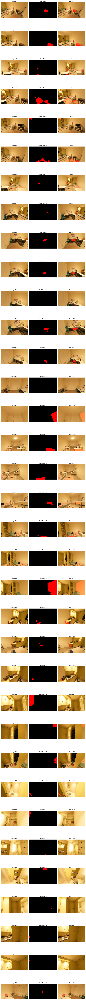

In [ ]:
import numpy as np
import torch
import clip
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt
from tqdm import tqdm 

device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-L/14", device)

prompts = ["chair"]
output_dir = "./output"
image_dir = "./images_0a7cc" 
original_images = []
masks = []

for sub_dir in tqdm(Path(output_dir).iterdir(), desc="Processing directories"):
    if sub_dir.is_dir():
        img_file = Path(image_dir) / f"{sub_dir.name}.JPG" 
        if img_file.exists():
            img = Image.open(img_file)
            original_images.append(img)

            img_input = preprocess(img).unsqueeze(0).to(device)
            with torch.no_grad():
                img_features = model.encode_image(img_input)

            text_input = clip.tokenize([prompts[0]]).to(device)
            with torch.no_grad():
                text_features = model.encode_text(text_input)

            similarity = (img_features @ text_features.T).item()

            if similarity > 0.5:
                best_mask = None
                best_similarity = -1 
                
                for mask_file in tqdm(sub_dir.glob("*.npy"), desc=f"Processing masks for {sub_dir.name}"):
                    pred_mask = np.load(mask_file, allow_pickle=True)

                    mask_colored = np.stack([pred_mask * 255, np.zeros_like(pred_mask), np.zeros_like(pred_mask)], axis=-1)

                    mask_input = Image.fromarray(mask_colored.astype(np.uint8))  
                    mask_input = preprocess(mask_input).unsqueeze(0).to(device)

                    with torch.no_grad():
                        mask_features = model.encode_image(mask_input)

                    mask_similarity = (mask_features @ text_features.T).item()

                    if mask_similarity > best_similarity:
                        best_similarity = mask_similarity
                        best_mask = pred_mask 
                if best_mask is not None:
                    masks.append(best_mask)

# masking
if len(masks) > 0:
    rows = len(masks) 
    plt.figure(figsize=(12, rows * 4))

    for idx, (orig_img, mask) in enumerate(zip(original_images, masks)):
        plt.subplot(rows, 3, idx * 3 + 1)
        orig_img = np.array(orig_img)
        plt.imshow(orig_img)
        plt.title(f"Original {idx + 1}")
        plt.axis('off')

        plt.subplot(rows, 3, idx * 3 + 2) 
        mask_colored = np.stack([mask * 255, np.zeros_like(mask), np.zeros_like(mask)], axis=-1) 
        plt.imshow(mask_colored)
        plt.title(f"Chair Mask {idx + 1}")
        plt.axis('off')

        plt.subplot(rows, 3, idx * 3 + 3)
        masked_image = np.where(mask_colored != 0, mask_colored, orig_img)
        plt.imshow(masked_image)
        plt.title(f"Masked {idx + 1}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()


## Here experemintal part starts................

So my fist try was to use the following code, with some post processing of masks. I think that i should use postprocessing when seen that there are too many holes on default segmentation photo. I started my way from pre-processing, i tried to use some Coputational Imaging magic, like a Canny filter, gaussian blur, kernell common blur and more and more. But after segmentation photo wasnt good at all... There are example:

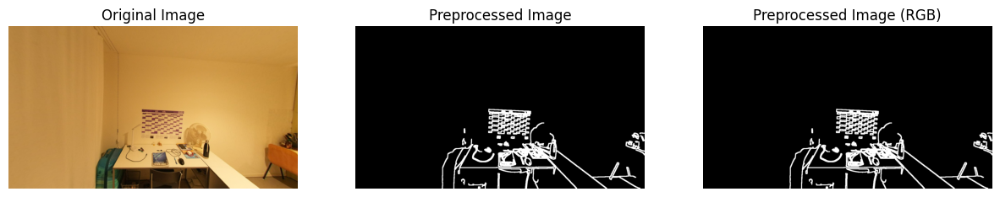

As you can see, оbjects of the environment have evaporated. And after a saw a single mask from single foto (of single object) i understood that we can try to repair mask because it was like 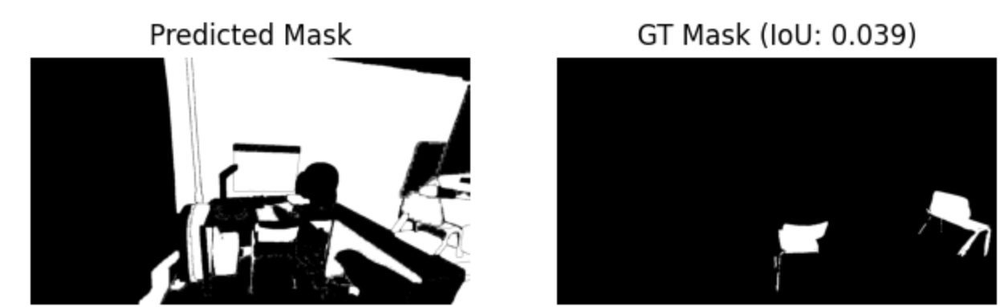

i make a code like this one

In [ ]:
sam2 = build_sam2(model_cfg, checkpoint, device=device, apply_postprocessing=True)

def load_image(image_path):
    image = Image.open(image_path).convert("RGB")
    return np.array(image)

image_path = "./images_0a7cc/DSC05921.JPG"
image_rgb = load_image(image_path)

# Генерация масок с помощью SAM2
mask_generator = SAM2AutomaticMaskGenerator(
    sam2,
    points_per_side=32,
    points_per_batch=64,
    pred_iou_thresh=0.3,
    stability_score_thresh=0.7,
    min_mask_region_area=50.0,
)

with torch.inference_mode():
    print("Generating masks for original image...")
    sam_result = mask_generator.generate(image_rgb)
print(f"Initial mask count: {len(sam_result)}")

# Постобработка масок
def clean_small_areas(mask, min_area=200):
    """Удаление мелких областей."""
    mask = mask.astype(np.uint8)
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(mask, connectivity=8)
    for label in range(1, num_labels):
        if stats[label, cv2.CC_STAT_AREA] < min_area:
            mask[labels == label] = 0
    return mask

def refine_edges(mask, kernel_size=(5, 5), iterations=3):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kernel_size)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=iterations)
    return mask

def combine_masks_by_proximity(masks, proximity_threshold=30):
    combined_masks = []
    for i, mask1 in enumerate(masks):
        merged = False
        for j, mask2 in enumerate(masks):
            if i != j:
                moments1 = cv2.moments(mask1)
                moments2 = cv2.moments(mask2)
                if moments1["m00"] != 0 and moments2["m00"] != 0:
                    center1 = (int(moments1["m10"] / moments1["m00"]), int(moments1["m01"] / moments1["m00"]))
                    center2 = (int(moments2["m10"] / moments2["m00"]), int(moments2["m01"] / moments2["m00"]))
                    distance = np.linalg.norm(np.array(center1) - np.array(center2))
                    if distance < proximity_threshold:
                        combined_mask = np.logical_or(mask1, mask2).astype(np.uint8)
                        masks[i] = combined_mask
                        masks[j] = combined_mask
                        merged = True
                        break
        if not merged:
            combined_masks.append(mask1)
    return combined_masks

def process_masks(masks, image_shape, min_area=200, kernel_size=(7, 7), closing_iterations=3, proximity_threshold=30):
    processed_masks = []
    for mask_data in tqdm(masks, desc="Postprocessing masks"):
        segmentation = mask_data.get("segmentation", np.zeros(image_shape, dtype=np.uint8))
        segmentation = clean_small_areas(segmentation, min_area)
        segmentation = refine_edges(segmentation, kernel_size, closing_iterations)
        processed_masks.append(segmentation)
    print("Combining masks based on proximity...")
    final_masks = combine_masks_by_proximity(processed_masks, proximity_threshold)
    return final_masks

# Генерация нескольких вариантов масок с разными параметрами
proximity_thresholds = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
results = []

for threshold in proximity_thresholds:
    print(f"Processing masks with proximity threshold: {threshold}")
    processed_masks = process_masks(
        sam_result, 
        image_rgb.shape[:2], 
        proximity_threshold=threshold
    )
    results.append((threshold, processed_masks))

# Визуализация результатов
def visualize_masks(image, masks, title="Processed Masks"):
    output = np.zeros((masks[0].shape[0], masks[0].shape[1], 3), dtype=np.uint8)
    for mask in masks:
        color = np.random.randint(100, 255, size=3, dtype=np.uint8)
        output[mask > 0] = color
    plt.figure(figsize=(12, 12))
    plt.imshow(output)
    plt.title(title)
    plt.axis("off")
    plt.show()

for threshold, masks in results:
    print(f"Visualizing results for proximity threshold: {threshold}")
    visualize_masks(image_rgb, masks, title=f"Threshold {threshold}")


And there you can see a different proximity_threshold wich helped me to remove a wall oversegmentation, oversegmentation of table and more. All images like this one you can find at .\CV_HW2\processed_images 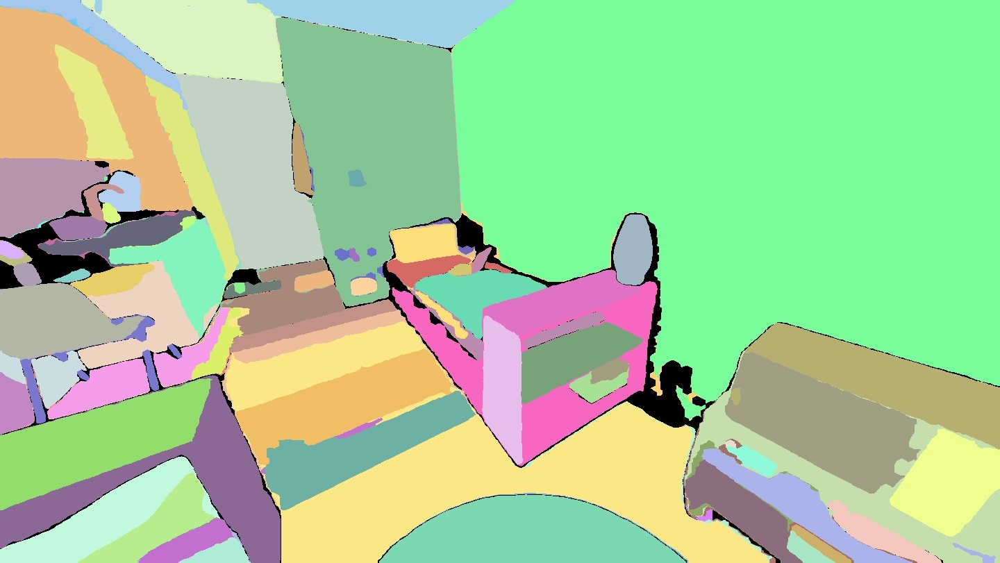

You can see, no dirty holes at carpet, no unbearable patterns on the lamp and blanket... Almost a dream)
And yes, i am understand that small objects are lost, but aim was be able to find a chair-size objects with pretty big IoU.

Then i tried to make сomparison of models with and without postprocessing

In [16]:
import os
import torch
import numpy as np
import cv2
from PIL import Image
from sam2.build_sam import build_sam2
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator

In [3]:
#models
checkpoint = r"C:\Users\Mi\OneDrive\Desktop\CV_HW2\checkpoints\sam2.1_hiera_large.pt"
model_cfg = r"C:\Users\Mi\OneDrive\Desktop\CV_HW2\checkpoints\sam2.1_hiera_l.yaml"

In [ ]:
#with postproc
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
sam2 = build_sam2(model_cfg, checkpoint, device=device, apply_postprocessing=True)
def load_image(image_path):
    image = Image.open(image_path).convert("RGB")
    return np.array(image)
def postprocess_mask(mask, min_area=200, kernel_size=(5, 5), closing_iterations=3):
    mask = mask.astype(np.uint8)
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(mask, connectivity=8)
    for label in range(1, num_labels):
        if stats[label, cv2.CC_STAT_AREA] < min_area:
            mask[labels == label] = 0
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, kernel_size)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=closing_iterations)

    return mask
def combine_masks_by_proximity(masks, proximity_threshold=1):
    combined_masks = []
    for i, mask1 in enumerate(masks):
        merged = False
        for j, mask2 in enumerate(masks):
            if i != j:
                dist = np.linalg.norm(np.array(np.where(mask1)).mean(axis=1) - 
                                      np.array(np.where(mask2)).mean(axis=1))
                if dist < proximity_threshold:
                    combined_mask = np.logical_or(mask1, mask2).astype(np.uint8)
                    masks[i] = combined_mask
                    masks[j] = combined_mask
                    merged = True
                    break
        if not merged:
            combined_masks.append(mask1)
    return combined_masks
def process_masks(masks, image_shape, min_area=200, kernel_size=(5, 5), closing_iterations=3, proximity_threshold=1):
    processed_masks = []
    for mask_data in masks:
        segmentation = mask_data.get("segmentation", np.zeros(image_shape, dtype=np.uint8))
        segmentation = postprocess_mask(segmentation, min_area, kernel_size, closing_iterations)
        processed_masks.append(segmentation)

    return combine_masks_by_proximity(processed_masks, proximity_threshold)
def process_directory(input_dir, output_dir, proximity_threshold=1, step=10):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    image_files = sorted(
        [f for f in os.listdir(input_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
    )
    image_files = image_files[::step]
    
    for image_file in tqdm(image_files, desc="Processing every 10th image"):
        image_path = os.path.join(input_dir, image_file)
        image_rgb = load_image(image_path)
        mask_generator = SAM2AutomaticMaskGenerator(
            sam2,
            points_per_side=32,
            points_per_batch=64,
            pred_iou_thresh=0.3,
            stability_score_thresh=0.7,
            min_mask_region_area=50.0,
        )
        
        with torch.inference_mode():
            sam_result = mask_generator.generate(image_rgb)
        processed_masks = process_masks(sam_result, image_rgb.shape[:2], proximity_threshold=proximity_threshold)
        output_image = np.zeros_like(image_rgb)
        for mask in processed_masks:
            color = np.random.randint(100, 255, size=(3,), dtype=np.uint8)
            output_image[mask > 0] = color
        output_image_path = os.path.join(output_dir, image_file)
        cv2.imwrite(output_image_path, cv2.cvtColor(output_image, cv2.COLOR_RGB2BGR))
        print(f"Saved processed image: {output_image_path}")
input_dir = r"C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_0a7cc"
output_dir = r"C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images"
process_directory(input_dir, output_dir)

Using device: cpu


Processing every 10th image:   0%|          | 0/35 [00:00<?, ?it/s]C:\Users\Mi\AppData\Local\Temp\ipykernel_19968\201650934.py:48: RuntimeWarning: Mean of empty slice.
  np.array(np.where(mask2)).mean(axis=1))
C:\Users\Mi\AppData\Local\Temp\ipykernel_19968\201650934.py:47: RuntimeWarning: Mean of empty slice.
  dist = np.linalg.norm(np.array(np.where(mask1)).mean(axis=1) -
Processing every 10th image:   3%|▎         | 1/35 [01:40<56:57, 100.52s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC05827.JPG


Processing every 10th image:   6%|▌         | 2/35 [03:27<57:28, 104.50s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC05837.JPG


Processing every 10th image:   9%|▊         | 3/35 [05:50<1:05:05, 122.05s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC05847.JPG


Processing every 10th image:  11%|█▏        | 4/35 [09:50<1:27:08, 168.65s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC05857.JPG


Processing every 10th image:  14%|█▍        | 5/35 [12:03<1:17:45, 155.52s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC05867.JPG


Processing every 10th image:  17%|█▋        | 6/35 [14:11<1:10:42, 146.30s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC05877.JPG


Processing every 10th image:  20%|██        | 7/35 [16:39<1:08:31, 146.83s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC05887.JPG


Processing every 10th image:  23%|██▎       | 8/35 [19:23<1:08:32, 152.32s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC05897.JPG


Processing every 10th image:  26%|██▌       | 9/35 [21:36<1:03:24, 146.34s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC05907.JPG


Processing every 10th image:  29%|██▊       | 10/35 [23:53<59:46, 143.47s/it] 

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC05917.JPG


Processing every 10th image:  31%|███▏      | 11/35 [25:24<50:53, 127.23s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC05927.JPG


Processing every 10th image:  34%|███▍      | 12/35 [28:13<53:42, 140.09s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC05937.JPG


Processing every 10th image:  37%|███▋      | 13/35 [29:50<46:34, 127.02s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC05947.JPG


Processing every 10th image:  40%|████      | 14/35 [31:39<42:35, 121.70s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC05957.JPG


Processing every 10th image:  43%|████▎     | 15/35 [32:56<35:59, 107.97s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC05967.JPG


Processing every 10th image:  46%|████▌     | 16/35 [2:33:46<11:54:59, 2257.88s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC05977.JPG


Processing every 10th image:  49%|████▊     | 17/35 [2:36:09<8:06:35, 1621.95s/it] 

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC05987.JPG


Processing every 10th image:  51%|█████▏    | 18/35 [2:38:24<5:32:57, 1175.13s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC05997.JPG


Processing every 10th image:  54%|█████▍    | 19/35 [2:40:33<3:49:36, 861.04s/it] 

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC06007.JPG


Processing every 10th image:  57%|█████▋    | 20/35 [2:43:36<2:44:18, 657.20s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC06017.JPG


Processing every 10th image:  60%|██████    | 21/35 [2:46:17<1:58:37, 508.40s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC06027.JPG


Processing every 10th image:  63%|██████▎   | 22/35 [2:51:47<1:38:33, 454.92s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC06037.JPG


Processing every 10th image:  66%|██████▌   | 23/35 [2:57:48<1:25:21, 426.78s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC06047.JPG


Processing every 10th image:  69%|██████▊   | 24/35 [3:02:59<1:11:49, 391.78s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC06057.JPG


Processing every 10th image:  71%|███████▏  | 25/35 [3:05:32<53:21, 320.13s/it]  

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC06067.JPG


Processing every 10th image:  74%|███████▍  | 26/35 [3:07:44<39:35, 263.96s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC06077.JPG


Processing every 10th image:  77%|███████▋  | 27/35 [3:10:28<31:10, 233.76s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC06087.JPG


Processing every 10th image:  80%|████████  | 28/35 [3:12:11<22:42, 194.60s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC06097.JPG


Processing every 10th image:  83%|████████▎ | 29/35 [3:13:51<16:36, 166.09s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC06107.JPG


Processing every 10th image:  86%|████████▌ | 30/35 [3:17:36<15:19, 183.98s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC06117.JPG


Processing every 10th image:  89%|████████▊ | 31/35 [3:20:13<11:43, 175.87s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC06127.JPG


Processing every 10th image:  91%|█████████▏| 32/35 [3:22:07<07:51, 157.33s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC06156.JPG


Processing every 10th image:  94%|█████████▍| 33/35 [3:23:47<04:39, 139.99s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC06166.JPG


Processing every 10th image:  97%|█████████▋| 34/35 [3:25:15<02:04, 124.39s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC06176.JPG


Processing every 10th image: 100%|██████████| 35/35 [3:27:01<00:00, 354.89s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\processed_images\DSC06188.JPG


In [ ]:
#without postproc
sam2 = build_sam2(model_cfg, checkpoint, device=device, apply_postprocessing=True)

def load_image(image_path):
    image = Image.open(image_path).convert("RGB")
    return np.array(image)

def process_directory(input_dir, output_dir, step=10):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    image_files = sorted(
        [f for f in os.listdir(input_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
    )
    image_files = image_files[::step]  #every 10th
    
    for image_file in tqdm(image_files, desc="Processing every 10th image"):
        image_path = os.path.join(input_dir, image_file)
        image_rgb = load_image(image_path)

        # mask generator
        mask_generator = SAM2AutomaticMaskGenerator(
            sam2,
            points_per_side=32,
            points_per_batch=64,
            pred_iou_thresh=0.3,
            stability_score_thresh=0.7,
            min_mask_region_area=50.0,
        )
        
        with torch.inference_mode():
            sam_result = mask_generator.generate(image_rgb)

        #Save mask
        output_image = np.zeros_like(image_rgb)
        for mask_data in sam_result:
            mask = mask_data["segmentation"]
            color = np.random.randint(100, 255, size=(3,), dtype=np.uint8)
            output_image[mask > 0] = color

        output_image_path = os.path.join(output_dir, image_file)
        cv2.imwrite(output_image_path, cv2.cvtColor(output_image, cv2.COLOR_RGB2BGR))
        print(f"Saved processed image: {output_image_path}")
output_dir = r"C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing"
process_directory(input_dir, output_dir)

Processing every 10th image:   3%|▎         | 1/35 [01:17<43:44, 77.18s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC05827.JPG


Processing every 10th image:   6%|▌         | 2/35 [02:34<42:20, 76.98s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC05837.JPG


Processing every 10th image:   9%|▊         | 3/35 [03:52<41:22, 77.58s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC05847.JPG


Processing every 10th image:  11%|█▏        | 4/35 [05:09<39:59, 77.40s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC05857.JPG


Processing every 10th image:  14%|█▍        | 5/35 [06:41<41:23, 82.79s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC05867.JPG


Processing every 10th image:  17%|█▋        | 6/35 [07:58<38:56, 80.56s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC05877.JPG


Processing every 10th image:  20%|██        | 7/35 [09:14<37:01, 79.35s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC05887.JPG


Processing every 10th image:  23%|██▎       | 8/35 [10:29<35:03, 77.91s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC05897.JPG


Processing every 10th image:  26%|██▌       | 9/35 [11:45<33:31, 77.35s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC05907.JPG


Processing every 10th image:  29%|██▊       | 10/35 [13:01<31:59, 76.78s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC05917.JPG


Processing every 10th image:  31%|███▏      | 11/35 [14:15<30:23, 75.98s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC05927.JPG


Processing every 10th image:  34%|███▍      | 12/35 [15:32<29:15, 76.31s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC05937.JPG


Processing every 10th image:  37%|███▋      | 13/35 [16:47<27:48, 75.83s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC05947.JPG


Processing every 10th image:  40%|████      | 14/35 [18:02<26:26, 75.57s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC05957.JPG


Processing every 10th image:  43%|████▎     | 15/35 [19:19<25:21, 76.06s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC05967.JPG


Processing every 10th image:  46%|████▌     | 16/35 [20:38<24:20, 76.87s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC05977.JPG


Processing every 10th image:  49%|████▊     | 17/35 [21:57<23:17, 77.65s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC05987.JPG


Processing every 10th image:  51%|█████▏    | 18/35 [23:13<21:51, 77.14s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC05997.JPG


Processing every 10th image:  54%|█████▍    | 19/35 [24:30<20:32, 77.03s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC06007.JPG


Processing every 10th image:  57%|█████▋    | 20/35 [25:46<19:13, 76.90s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC06017.JPG


Processing every 10th image:  60%|██████    | 21/35 [27:03<17:55, 76.82s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC06027.JPG


Processing every 10th image:  63%|██████▎   | 22/35 [28:21<16:42, 77.08s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC06037.JPG


Processing every 10th image:  66%|██████▌   | 23/35 [29:40<15:33, 77.83s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC06047.JPG


Processing every 10th image:  69%|██████▊   | 24/35 [30:58<14:15, 77.79s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC06057.JPG


Processing every 10th image:  71%|███████▏  | 25/35 [32:14<12:51, 77.11s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC06067.JPG


Processing every 10th image:  74%|███████▍  | 26/35 [33:28<11:27, 76.43s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC06077.JPG


Processing every 10th image:  77%|███████▋  | 27/35 [34:46<10:13, 76.72s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC06087.JPG


Processing every 10th image:  80%|████████  | 28/35 [35:58<08:47, 75.41s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC06097.JPG


Processing every 10th image:  83%|████████▎ | 29/35 [37:11<07:27, 74.62s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC06107.JPG


Processing every 10th image:  86%|████████▌ | 30/35 [38:26<06:13, 74.66s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC06117.JPG


Processing every 10th image:  89%|████████▊ | 31/35 [39:40<04:58, 74.61s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC06127.JPG


Processing every 10th image:  91%|█████████▏| 32/35 [40:54<03:43, 74.44s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC06156.JPG


Processing every 10th image:  94%|█████████▍| 33/35 [42:09<02:29, 74.53s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC06166.JPG


Processing every 10th image:  97%|█████████▋| 34/35 [43:25<01:15, 75.11s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC06176.JPG


Processing every 10th image: 100%|██████████| 35/35 [44:44<00:00, 76.70s/it]

Saved processed image: C:\Users\Mi\OneDrive\Desktop\CV_HW2\images_no_processing\DSC06188.JPG


And there are a comparison of photos, by clip "сhair-like promts"

And by txt file i make some interesting plots for you